In [1]:
import os
os.environ['NUMPY_EXPERIMENTAL_ARRAY_FUNCTION'] = '0'

from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import gcsfs # A pythonic file-system interface to Google Cloud Storage
from tqdm.autonotebook import tqdm

%matplotlib inline
plt.rcParams['figure.figsize'] = 12, 6
%config InlineBackend.figure_format = 'retina' 

/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:9: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  if __name__ == '__main__':


In [2]:
import math
import copy
from scipy.interpolate import griddata
import seawater as sw
from mpl_toolkits.basemap import Basemap, cm, maskoceans

In [3]:
# Cluster was created via the dask labextension
# Delete this cell and replace with a new one

from dask.distributed import Client
from dask_kubernetes import KubeCluster

cluster = KubeCluster()
cluster.adapt(minimum=1, maximum=20, interval='2s')
client = Client(cluster)
client

distributed.scheduler - INFO - Clear task state
distributed.scheduler - INFO -   Scheduler at:   tcp://10.32.0.240:38681
distributed.scheduler - INFO -   dashboard at:                     :8787
distributed.scheduler - INFO - Receive client connection: Client-564e1d50-7042-11ea-81de-7edd163b4f72
distributed.core - INFO - Starting established connection


Client Scheduler: tcp://10.32.0.240:38681 Dashboard: /user/0000-0002-3606-2575/proxy/8787/status,Cluster Workers: 0 Cores: 0 Memory: 0 B


In [4]:
import warnings; warnings.simplefilter('ignore')

In [5]:
def func_latlon_regrid_eq(lat_n_regrid, lon_n_regrid, lat_min_regrid, lat_max_regrid, lon_min_regrid, lon_max_regrid): 
    #### Latitude Bounds ####
    Lat_regrid_1D= np.zeros ((lat_n_regrid+1));
    Lat_bound_regrid = np.zeros ((lat_n_regrid+1,2)); Lat_bound_regrid[0,0]=-90;  Lat_bound_regrid[0,1]=Lat_bound_regrid[0,0] + ( (180/lat_n_regrid) /2 ); Lat_regrid_1D[0]=(Lat_bound_regrid[0,0]+Lat_bound_regrid[0,1])/2
    for ii in range(1,lat_n_regrid+1):
        Lat_bound_regrid[ii,0]=Lat_bound_regrid[ii-1,1]
        Lat_bound_regrid[ii,1]=Lat_bound_regrid[ii,0] +  (180/lat_n_regrid)
        Lat_regrid_1D[ii]=(Lat_bound_regrid[ii,0]+Lat_bound_regrid[ii,1])/2
    Lat_bound_regrid[-1,1]=90;  Lat_regrid_1D[-1]=(Lat_bound_regrid[-1,0]+Lat_bound_regrid[-1,1])/2
    #### Longitude Bounds ####
    Lon_regrid_1D= np.zeros ((lon_n_regrid));
    Lon_bound_regrid = np.zeros ((lon_n_regrid,2)); Lon_bound_regrid[0,0]=0;  Lon_bound_regrid[0,1]=Lon_bound_regrid[0,0] + (360/lon_n_regrid); Lon_regrid_1D[0]=(Lon_bound_regrid[0,0]+Lon_bound_regrid[0,1])/2
    for ii in range(1,lon_n_regrid):
        Lon_bound_regrid[ii,0]=Lon_bound_regrid[ii-1,1]
        Lon_bound_regrid[ii,1]=Lon_bound_regrid[ii,0] +  (360/lon_n_regrid)
        Lon_regrid_1D[ii]=(Lon_bound_regrid[ii,0]+Lon_bound_regrid[ii,1])/2
    
    return Lat_regrid_1D, Lon_regrid_1D, Lat_bound_regrid, Lon_bound_regrid


def func_regrid(Data_orig, Lat_orig, Lon_orig, Lat_regrid_2D, Lon_regrid_2D):    
    
    Lon_orig[Lon_orig < 0] +=360
    if np.ndim(Lon_orig)==1: # If the GCM grid is not curvlinear
        Lon_orig,Lat_orig=np.meshgrid(Lon_orig, Lat_orig)
        
    lon_vec = np.asarray(Lon_orig)
    lat_vec = np.asarray(Lat_orig)
    lon_vec = lon_vec.flatten()
    lat_vec = lat_vec.flatten()
    coords=np.squeeze(np.dstack((lon_vec,lat_vec)))

    Data_orig=np.squeeze(Data_orig)
    if Data_orig.ndim==2:#this is for 2d regridding
        data_vec = np.asarray(Data_orig)
        if np.ndim(data_vec)>1:
            data_vec = data_vec.flatten()
        Data_regrid = griddata(coords, data_vec, (Lon_regrid_2D, Lat_regrid_2D), method='nearest')
        return np.asarray(Data_regrid)
    if Data_orig.ndim==3:#this is for 3d regridding
        Data_regrid=[]
        for d in range(len(Data_orig)):
            z = np.asarray(Data_orig[d,:,:])
            if np.ndim(z)>1:
                z = z.flatten()
            zi = griddata(coords, z, (Lon_regrid_2D, Lat_regrid_2D), method='nearest')
            Data_regrid.append(zi)
        return np.asarray(Data_regrid)

def func_oceanlandmask(Lat_regrid_2D, Lon_regrid_2D):
    lat_n_regrid, lon_n_regrid =Lat_regrid_2D.shape[0], Lat_regrid_2D.shape[1]
    Ocean_Land_mask = np.empty ((lat_n_regrid, lon_n_regrid)) * np.nan
    ocean_mask= maskoceans(Lon_regrid_2D-180, Lat_regrid_2D, Ocean_Land_mask)
    for ii in range(lat_n_regrid):
        for jj in range(lon_n_regrid):
            if np.ma.is_masked(ocean_mask[ii,jj]):
                Ocean_Land_mask[ii,jj]=1 # Land_Ocean_mask=1 means grid cell is ocean (not on land)
            else:
                Ocean_Land_mask[ii,jj]=0 # Land_Ocean_mask=0 means grid cell is land
    land_mask2 = copy.deepcopy ( Ocean_Land_mask ) # The created land_mask's longitude is from -180-180 - following lines transfer it to 0-360
    Ocean_Land_mask = np.empty((Lat_regrid_2D.shape[0], Lat_regrid_2D.shape[1])) * np.nan
    Ocean_Land_mask[:,0:int(Ocean_Land_mask.shape[1]/2)]=land_mask2[:,int(Ocean_Land_mask.shape[1]/2):]
    Ocean_Land_mask[:,int(Ocean_Land_mask.shape[1]/2):]=land_mask2[:,0:int(Ocean_Land_mask.shape[1]/2)]
    
    return Ocean_Land_mask # 1= ocean, 0= land

#### running mean calculation ####
def runningMeanFast(x, N):
    return np.convolve(x, np.ones((N,))/N)[(N-1):]

#### Compute and plot lagged regression plot####
def lag_cor(x,y,lag, c, l):
    stat=[]
    from scipy import stats
    for i in range(2*lag):
        slope, intercept, r_value, p_value, std_err = stats.linregress(x[lag:len(x)-lag], y[i:len(y)-2*lag+i])
        stat.append(r_value)
    x=np.linspace(-lag,lag+1, 2*lag)
    plt.grid(True,which="both",ls="-", color='0.65')
    plt.plot(x, stat, c, label=l, linewidth=3.0)
    plt.xlabel('Year lag')
    plt.ylabel('r')
    
def lag_cor_data(x,y,lag):
    stat=[]
    from scipy import stats
    for i in range(2*lag):
        slope, intercept, r_value, p_value, std_err = stats.linregress(x[lag:len(x)-lag], y[i:len(y)-2*lag+i])
        stat.append(r_value)
    return stat

In [6]:
def func_plotmap_contourf(P_Var, P_Lon, P_Lat, P_range, P_title, P_unit, P_cmap, P_proj, P_lon0, P_latN, P_latS, P_c_fill):

### P_Var= Plotting variable, 2D(lat,lon) || P_Lon=Longitude, 2D || P_range=range of plotted values, can be vector or number || P_title=Plot title || P_unit=Plot colorbar unit
### P_cmap= plt.cm.seismic , plt.cm.jet || P_proj= 'cyl', 'npstere', 'spstere' || P_lon0=middle longitude of plot || P_latN=upper lat bound of plot || P_latS=lower lat bound of plot || P_c_fill= 'fill' fills the continets with grey color
    
#%% Example :
    
#Plot_Var = np.nanmean(Wind_Curl,axis=0)
#cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99)))
#Plot_range=np.linspace(-cmap_limit,cmap_limit,101) ### Or:  Plot_range=100
#Plot_unit='(N/m3)'; Plot_title= 'Wind Curl (1E-7 N/m3) - (contour lines = Tau_x) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)
#fig, m = func_plotmap_contourf(Plot_Var, Lon_regrid_2D, Lat_regrid_2D, Plot_range, Plot_title, Plot_unit, plt.cm.seismic, 'cyl', 210., 80., -80., 'fill')
#fig.savefig(dir_figs+'name.png', format='png', dpi=300, transparent=True, bbox_inches='tight')
#%%  
    fig=plt.figure()
    
    if P_proj=='npstere':
        m = Basemap( projection='npstere',lon_0=0, boundinglat=30)
        m.drawparallels(np.arange(-90,90,20), labels=[1,1,0,1], linewidth=1, color='k', fontsize=20)
        m.drawmeridians(np.arange(0,360,30), labels=[1,1,0,1], linewidth=1, color='k', fontsize=20)
    elif P_proj=='spstere':
        m = Basemap( projection='spstere',lon_0=180, boundinglat=-30)
        m.drawparallels(np.arange(-90,90,20), labels=[1,1,0,1], linewidth=1, color='k', fontsize=20)
        m.drawmeridians(np.arange(0,360,30), labels=[1,1,0,1], linewidth=1, color='k', fontsize=20)        
    else:
         m = Basemap( projection=P_proj, lon_0=P_lon0, llcrnrlon=P_lon0-180, llcrnrlat=P_latS, urcrnrlon=P_lon0+180, urcrnrlat=P_latN)
         m.drawparallels(np.arange(P_latS, P_latN+0.001, 40.),labels=[True,False,False,False], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Latitutes
         m.drawmeridians(np.arange(P_lon0-180,P_lon0+180,60.),labels=[False,False,False,True], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Longitudes        
    if P_c_fill=='fill':
        m.fillcontinents(color='0.8')
    m.drawcoastlines(linewidth=1.0, linestyle='solid', color='k', antialiased=1, ax=None, zorder=None)
    im=m.contourf(P_Lon, P_Lat, P_Var,P_range,latlon=True, cmap=P_cmap, extend='both')
    if P_proj=='npstere' or P_proj=='spstere':
        cbar = m.colorbar(im,"right", size="4%", pad="14%")
    else:
        cbar = m.colorbar(im,"right", size="3%", pad="2%")
    cbar.ax.tick_params(labelsize=20) 
    cbar.set_label(P_unit)
    plt.title(P_title, fontsize=18)
    mng = plt.get_current_fig_manager()
    #mng.window.showMaximized() # Maximizes the plot window to save figures in full
    
    #m = Basemap( projection='cyl',lon_0=210., llcrnrlon=30.,llcrnrlat=-80.,urcrnrlon=390.,urcrnrlat=80.)    
    #m.drawparallels(np.arange(-90.,90.001,30.),labels=[True,False,False,False], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Latitutes
    #m.drawmeridians(np.arange(0.,360.,60.),labels=[False,False,False,True], linewidth=0.01, color='k', fontsize=18) # labels = [left,right,top,bottom] # Longitudes
    #plt.close()
    
    return fig, m


def func_plot2Dcolor_contourf(P_Var_x1, P_Var_y1, P_Var_z1, P_range, P_xlable, P_ylable, P_title, P_unit, P_cmap, P_invert_yaxis):

    fig=plt.figure()
    im = plt.contourf(P_Var_x1, P_Var_y1, P_Var_z1, P_range, cmap=P_cmap, extend='both')

    if P_invert_yaxis == 'invert_yaxis':
        plt.gca().invert_yaxis()
    plt.xticks(fontsize = 26); plt.yticks(fontsize = 26)
    plt.xlabel(P_xlable, fontsize=18)
    plt.ylabel(P_ylable, fontsize=18)
    plt.title(P_title, fontsize=18)
    #m = Basemap( projection='cyl', lon_0=0) # This is only added to be used for the cbar in the next line
    #cbar = m.colorbar(im,"right", size="3%", pad="2%", extend='max') # extend='both' will extend the colorbar in both sides (upper side and down side)
    cbar = plt.colorbar(im)
    cbar.set_label(P_unit)
    cbar.ax.tick_params(labelsize=18) 
    mng = plt.get_current_fig_manager()
    #mng.window.showMaximized() # Maximizes the plot window to save figures in full
        
    return fig

def func_plotline_1var(P_Var_x, P_Var_y, P_xlable, P_ylable, P_title, P_color, P_invert_yaxis):
### P_Var_x= Plotting variable at X-axis, 1D(X) || P_Var_y= Plotting variable at Y-axis , 1D(Y)
### P_xlable=lable to be shown on x-axis || P_ylable=lable to be shown on y-axis || P_title=Plot title || P_color=contour color || P_invert_yaxis='yes' inverts the y axis (lower values plotted at top)

#%% Example :
    
#P_Var_x=Density #or P_Var_x=years=np.linspace(year_start,year_end,year_end-year_start+1)
#P_Var_y=Depths
#P_xlable='Potential Density [kg/m3]'
#P_ylable='Depth [m]'
#P_title='Potential Density Ave - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)
#fig = func_plotline_1var(P_Var_x, P_Var_y, P_xlable, P_ylable, P_title, 'darkcyan', 'invert_yaxis')
#fig.savefig(dir_figs+'name.png', format='png'time,, dpi=300, transparent=True, bbox_inches='tight')
#%%
    fig=plt.figure()
    im1=plt.plot(P_Var_x, P_Var_y, c=P_color, linewidth=3.0)
    if P_invert_yaxis == 'invert_yaxis':
        plt.gca().invert_yaxis()
    plt.xticks(fontsize = 26); plt.yticks(fontsize = 26)
    plt.xlabel(P_xlable, fontsize=18)
    plt.ylabel(P_ylable, fontsize=18)
    plt.title(P_title, fontsize=18)
    mng = plt.get_current_fig_manager()
        
    return fig


## Regridding calculations
creating new coordinate grid, same which was used in interpolation in data processing code

In [7]:
lat_n_regrid, lon_n_regrid = 180, 360 # Number of Lat and Lon elements in the regridded data
lon_min_regrid, lon_max_regrid = 0, 360 # Min and Max value of Lon in the regridded data
lat_min_regrid, lat_max_regrid = -90, 90 # Min and Max value of Lat in the regridded data

Lat_regrid_1D, Lon_regrid_1D, Lat_bound_regrid, Lon_bound_regrid = func_latlon_regrid_eq(lat_n_regrid, lon_n_regrid, lat_min_regrid, lat_max_regrid, lon_min_regrid, lon_max_regrid)
Lon_regrid_2D, Lat_regrid_2D = np.meshgrid(Lon_regrid_1D, Lat_regrid_1D)

Ocean_Land_mask = func_oceanlandmask(Lat_regrid_2D, Lon_regrid_2D) # 1= ocean, 0= land

In [8]:
#df = pd.read_csv('https://storage.googleapis.com/pangeo-cmip6/pangeo-cmip6-zarr-consolidated-stores.csv')

In [9]:
df = pd.read_csv('pangeo-cmip6-zarr-consolidated-stores.csv')

In [10]:
def func_load_ds_uri(uri):
    """
    Load data for given uri
    """
    gcs = gcsfs.GCSFileSystem(token='anon') # GCSFS will attempt to use your default gcloud credentials
    ds = xr.open_zarr(gcs.get_mapper(uri), consolidated=True)
    return ds

In [11]:
GCM_name = 'GFDL-CM4'

In [12]:
df_plt = df[(df.table_id == 'Omon') & (df.variable_id == 'thetao') & (df.activity_id == 'CMIP') & (df.experiment_id == 'piControl')& (df.source_id==GCM_name)]
df_plt = df_plt[ df_plt['grid_label'] == 'gr']
#run_counts = df_plt.groupby(['source_id', 'experiment_id'])['zstore'].count()
#run_counts
uri_thetao = df_plt[(df_plt.source_id == GCM_name)].zstore.values[0]
uri_thetao

'gs://cmip6/CMIP/NOAA-GFDL/GFDL-CM4/piControl/r1i1p1f1/Omon/thetao/gr/'

In [13]:
df_plt = df[(df.table_id == 'Omon') & (df.variable_id == 'so') & (df.activity_id == 'CMIP') & (df.experiment_id == 'piControl')& (df.source_id==GCM_name)]
df_plt = df_plt[ df_plt['grid_label'] == 'gr']
uri_so = df_plt[(df_plt.source_id == GCM_name)].zstore.values[0]
uri_so

'gs://cmip6/CMIP/NOAA-GFDL/GFDL-CM4/piControl/r1i1p1f1/Omon/so/gr/'

In [14]:
ds_thetao = func_load_ds_uri(uri_thetao)
ds_so = func_load_ds_uri(uri_so)

distributed.scheduler - INFO - Register tcp://10.32.5.4:33457
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.5.4:33457
distributed.core - INFO - Starting established connection


In [15]:
GCM = GCM_name
year_start=1
year_end=500

conv_index_depth = 500

In [16]:
ds_thetao = ds_thetao.isel(time=slice(year_start-1, year_end*12))
ds_so = ds_so.isel(time=slice(year_start-1, year_end*12))

In [17]:
Depths=ds_thetao.lev.values
Depths.shape

(35,)

In [18]:
def func_MLD(dset_thetao, dset_so, month_no, hemis_no):
    import seawater as sw
    
    yrs_no = np.int(len(ds_thetao.time)/12)
    Depths=ds_thetao.lev.values

    if hemis_no==0:
        depth_MLD_tr=2000 # Weddell Sea - [30E-60W]
    elif hemis_no==1:
        depth_MLD_tr=1000 # Labrador Sea  - [60W-30W]
    elif hemis_no==2:
        depth_MLD_tr=2000 # Norwegian Sea
    elif hemis_no==3:
        depth_MLD_tr=1000 # Labrador Sea - Extended [60W-40W]  
    elif hemis_no==4:
        depth_MLD_tr=2000 # Ross Sea  - [160E-230E]           
    else:
        depth_MLD_tr=2000
    deep_conv_area=[]
    
    Lon_orig=ds_thetao.lon.values
    Lat_orig=ds_thetao.lat.values 
    if np.ndim(Lon_orig)==1: # If the GCM grid is not curvlinear
        Lon_orig,Lat_orig=np.meshgrid(Lon_orig, Lat_orig)    
        
    lat_n=Lat_orig.shape[0] # Number of Lat elements in the data
    lon_n=Lon_orig.shape[1] # Number of Lon elements in the data
    earth_R = 6378e3 # Earth Radius - Unit is kilometer (km)
    GridCell_Areas = np.zeros ((lat_n, lon_n )) # A = 2*pi*R^2 |sin(lat1)-sin(lat2)| |lon1-lon2|/360 = (pi/180)R^2 |lon1-lon2| |sin(lat1)-sin(lat2)| 
    for ii in range(1,lat_n-1):
        for jj in range(1,lon_n-1):
            GridCell_Areas [ii,jj] = math.fabs( (earth_R**2) * (math.pi/180) * np.absolute( (Lon_orig[ii,jj-1]+Lon_orig[ii,jj])/2  -  (Lon_orig[ii,jj]+Lon_orig[ii,jj+1])/2 )  * np.absolute( math.sin(math.radians( ( Lat_orig[ii-1,jj]+Lat_orig[ii,jj])/2 )) - math.sin(math.radians( Lat_orig[ii,jj]+Lat_orig[ii+1,jj])/2  )) )                  
    for ii in range(1,lat_n-1):
        for jj in range(2,lon_n-2):
            if GridCell_Areas [ii,jj] > GridCell_Areas [ii,jj-1]*3:
                GridCell_Areas [ii,jj]=GridCell_Areas [ii,jj-1]
            if GridCell_Areas [ii,jj] > GridCell_Areas [ii,jj+1]*3:
                GridCell_Areas [ii,jj]=GridCell_Areas [ii,jj+1]
    GridCell_Areas[0,:]=GridCell_Areas[1,:]; GridCell_Areas[-1,:]=GridCell_Areas[-2,:]
    GridCell_Areas[:,0]=GridCell_Areas[:,1]; GridCell_Areas[:,-1]=GridCell_Areas[:,-2]
    areacello=GridCell_Areas      
    
    lat_n_regrid=90
    lon_n_regrid=180
    Lat_regrid_1D, Lon_regrid_1D, Lat_bound_regrid, Lon_bound_regrid = func_latlon_regrid_eq(lat_n_regrid, lon_n_regrid, -90, 90, 0, 360)
    lon, lat = np.meshgrid(Lon_regrid_1D, Lat_regrid_1D)
    areacello = func_regrid(areacello, Lat_orig, Lon_orig, lat, lon)
    
    # ds_so.so.isel(lev=slice(0,10))   # slice(start, end, step)
    
    data_plot=np.full([yrs_no,len(lon),len(lon[0])], np.nan)    
    
    for t in tqdm(range(yrs_no)):
        #print('MLD calc - Year: ', t+1)
        data_thetao_extracted = ds_thetao.thetao.isel(time= 12*t+month_no-1 ).values
        data_so_extracted = ds_so.so.isel(time= 12*t+month_no-1 ).values
        data_dens=sw.dens0(data_so_extracted, data_thetao_extracted)
        depth10m_shalow=0
        depth10m_deep=0
        depth_array=np.asarray(Depths)
        
        for k in range(len(Depths)):
            if Depths[k]<=10:
                depth10m_shalow=k
        for k in range(len(Depths)):        
            if Depths[k]>=10:
                depth10m_deep+=k
                break
                
        interpol_x = [Depths[depth10m_shalow], Depths[depth10m_deep]]
        data_i=data_dens
        data_i = func_regrid(data_dens, Lat_orig, Lon_orig, lat, lon)
        data_i[data_i>100000]=np.nan
        
        if (int(hemis_no)==int(0)):# Weddell Sea
            [ii,jj] = np.where(lat<=-50)###indeces####
        elif (int(hemis_no)==int(1)):# Labrador Sea  - [60W-30W]
            [ii,jj] = np.where(lat>=50)###indeces####
        elif (int(hemis_no)==int(2)):# Norwegian Sea
            [ii,jj] = np.where(lat>=58)###indeces####
        elif (int(hemis_no)==int(3)):# Labrador Sea  - [60W-40W]  
            [ii,jj] = np.where(lat>=50)###indeces####   
        elif (int(hemis_no)==int(4)):# Ross Sea  - [160E-230E]   
            [ii,jj] = np.where(lat<=-50)###indeces####             
        else:
            print(hemis_no)
            print('invalid input for hemisphere option')
            break                

        area=0
        for k in range(len(ii)):
            if not(str(data_i[0,ii[k],jj[k]])=='nan'):
                dummy=100
                interpol_dens = [data_i[depth10m_shalow,ii[k],jj[k]], data_i[depth10m_deep,ii[k],jj[k]]]
                p_10m_dens = np.interp(10, interpol_x, interpol_dens)
                for d in range(len(data_i)):
                    if not(str(data_i[0,ii[k],jj[k]])=='nan'):
                        p_dens = data_i[d,ii[k],jj[k]]
                        if abs(p_dens-p_10m_dens-0.03)<dummy:
                            dummy=abs(p_dens-p_10m_dens-0.03)
                            MLD=d
                if MLD==0:
                    MLD+=1
                    p_dens_interpol = [data_i[MLD-1,ii[k],jj[k]]-p_10m_dens,data_i[MLD,ii[k],jj[k]]-p_10m_dens,data_i[MLD+1,ii[k],jj[k]]-p_10m_dens]
                    depth_levels = [depth_array[MLD-1],depth_array[MLD],depth_array[MLD+1]]
                ##elif MLD==49:
                elif MLD==len(data_i)-1: # If MLD is the last layer                   
                    MLD-=1
                    p_dens_interpol = [data_i[MLD-1,ii[k],jj[k]]-p_10m_dens,data_i[MLD,ii[k],jj[k]]-p_10m_dens,data_i[MLD+1,ii[k],jj[k]]-p_10m_dens]
                    depth_levels = [depth_array[MLD-1],depth_array[MLD],depth_array[MLD+1]]
                else:
                    p_dens_interpol = [data_i[MLD-1,ii[k],jj[k]]-p_10m_dens,data_i[MLD,ii[k],jj[k]]-p_10m_dens,data_i[MLD+1,ii[k],jj[k]]-p_10m_dens]
                    depth_levels = [depth_array[MLD-1],depth_array[MLD],depth_array[MLD+1]]
                interpol_z=np.interp(0.03,p_dens_interpol,depth_levels)
                if interpol_z>=depth_MLD_tr:
                #y1+=float(interpol_z)
                    area+=areacello[ii[k],jj[k]]
                    data_plot[t,ii[k],jj[k]]=float(interpol_z)     
        deep_conv_area.append(area)
    deep_conv_area=np.asarray(deep_conv_area)   
    
    average_MLD=np.nanmean(data_plot,axis=0)
    if hemis_no==0: # SH, Weddell Sea
        indeces = np.where(np.logical_or((lon<=30) & (average_MLD>depth_MLD_tr), (lon>=300) &(average_MLD>depth_MLD_tr)))
    elif hemis_no==1: # NH, Labrador Sea  - [60W-30W]
        indeces = np.where(np.logical_and((lon>=30) & (average_MLD>depth_MLD_tr), (lon<=330) &(average_MLD>depth_MLD_tr)))
    elif hemis_no==2: # NH, Norwegian Sea
        indeces = np.where(np.logical_or((lon<=30) & (average_MLD>depth_MLD_tr), (lon>=345) &(average_MLD>depth_MLD_tr)))
    elif hemis_no==3: # NH, Labrador Sea  - [60W-40W]
        indeces = np.where(np.logical_and((lon>=30) & (average_MLD>depth_MLD_tr), (lon<=320) &(average_MLD>depth_MLD_tr)))
    elif hemis_no==4: # NH, Ross Sea  - [160E-230E] 
        indeces = np.where(np.logical_and((lon>=160) & (average_MLD>depth_MLD_tr), (lon<=230) &(average_MLD>depth_MLD_tr)))        
    else: ### This should never be the case though ###
        indeces = np.where(np.logical_and((lon>=30) & (average_MLD>depth_MLD_tr), (lon<=330) &(average_MLD>depth_MLD_tr)))        
        
    return deep_conv_area, data_plot, lon, lat, indeces     
    

In [19]:
def func_time_depth_plot(dset_thetao, indeces, conv_index_depth):

    Depths=ds_thetao.lev.values
    yrs_no = np.int(len(ds_thetao.time)/12)
    Lon_orig=ds_thetao.lon.values
    Lat_orig=ds_thetao.lat.values    
    
    [ii,jj]=indeces
    region=[]
    
    lat_n_regrid=90
    lon_n_regrid=180
    Lat_regrid_1D, Lon_regrid_1D, Lat_bound_regrid, Lon_bound_regrid = func_latlon_regrid_eq(lat_n_regrid, lon_n_regrid, -90, 90, 0, 360)
    lon, lat = np.meshgrid(Lon_regrid_1D, Lat_regrid_1D)     
    
    for t in tqdm(range(yrs_no)):
        data = ds_thetao.thetao.isel(time= slice(12*t,12*t+11) ).values
        data=np.asarray(data)
        #data[data>100000]=np.nan
        data=np.nanmean(data,axis=0)
        data=np.squeeze(data)
        data_i = func_regrid(data, Lat_orig, Lon_orig, lat, lon)
        data_i=data_i[:,ii,jj]
        
        #print('time_depth_plot calc - Year: ', t+1)
        region.append(np.nanmean(data_i,axis=1))

    depth_index_start=0
    depth_index_end=0
    if conv_index_depth==0:
        depth_index_start=0
        depth_index_end=1
    else:
        for i in range(len(Depths[:])):
            if Depths[i]<=conv_index_depth:
                depth_index_start=i
        for i in range(len(Depths[:])):
            if Depths[i]<=conv_index_depth:
                depth_index_end=i
    if depth_index_end==0:
        depth_index_end+=1        
        
        
    print(depth_index_start)
    region=np.asarray(region)
    convection_index=region[:,depth_index_start]
    return region,convection_index

In [ ]:
#############################################################################
###### YOU DON'T NEED TO RUN THIS SECTION AS IT WILL TAKE A WHILE 
###### MOVE A FEW CELL DOWN WHERE IT SAYS "To restore:", AND RUN THAT
###### THIS WILL LOAD THE RESULTS TAHT ARE PREVIOUSLY CALCULATED AND MOVE ON TO PLOTS
#############################################################################

In [ ]:
### LAB_index and WS_index are the convection indeces at 500m depth ###
#### Weddel Sea Caclulations ####
month_no=9 # month of the year
hemis_no=0 # 0 = Weddell Sea, 1 = Labrador Sea, 2 = Norwegian Sea, 4 = Ross Sea
conv_index_depth_ws=500 # args[7] in func_time_depth_plot code - depth for Convection Index

Conv_area_timeseries_WS, MLD_years_WS, lon_mld_WS, lat_mld_WS, WS_indeces_lonlat = func_MLD(ds_thetao, ds_so, month_no, hemis_no)
MLD_average_WS=np.nanmean(MLD_years_WS,axis=0)

In [ ]:
WS_index_time_depth, WS_index=func_time_depth_plot(ds_thetao, WS_indeces_lonlat, conv_index_depth_ws) # WS_index is the convection indeces at 500m depth
WS_index_norm=(WS_index-np.nanmean(WS_index))/np.std(WS_index) # Normalized Convection Index

WS_index_norm_rm = runningMeanFast(WS_index_norm, 10)#if data is not smoothed
WS_index_norm_rm=WS_index_norm_rm[:-9]

In [27]:
#### Ross Sea Caclulations ####
month_no=9 # month of the year
hemis_no=4 # 0 = Weddell Sea, 1 = Labrador Sea, 2 = Norwegian Sea, 4 = Ross Sea
conv_index_depth_ross = 500

Conv_area_timeseries_ROSS, MLD_years_ROSS, lon_mld_ROSS, lat_mld_ROSS, ROSS_indeces_lonlat = func_MLD(ds_thetao, ds_so, month_no, hemis_no)
MLD_average_ROSS=np.nanmean(MLD_years_ROSS,axis=0)

ROSS_index_time_depth, ROSS_index=func_time_depth_plot(ds_thetao, ROSS_indeces_lonlat, conv_index_depth_ross) # ROSS_index is the convection indeces at 500m depth
ROSS_index_norm=(ROSS_index-np.nanmean(ROSS_index))/np.std(ROSS_index) # Normalized Convection Index

ROSS_index_norm_rm = runningMeanFast(ROSS_index_norm, 10) #if data is not smoothed
ROSS_index_norm_rm=ROSS_index_norm_rm[:-9]

In [29]:
# var_list_short=['GCM', 'Conv_area_timeseries_ROSS', 'MLD_average_ROSS', 'MLD_years_ROSS', 'ROSS_indeces_lonlat', 'ROSS_index', 'ROSS_index_norm', 'ROSS_index_norm_rm', 
#        'ROSS_index_time_depth', 'conv_index_depth_ross', 'lat_mld_ROSS', 'lon_mld_ROSS' ]

# ###############################################################################
# ###########                 Saving Results                #####################
# import os
# import shelve

# dir_pwd = os.getcwd() # Gets the current directory (and in which the code is placed)
# filename_out = (dir_pwd + '/AllResults_'+GCM+'_500yr_ROSS.out') # Directory to save processed data

# ### To save
# my_shelf = shelve.open(filename_out,'n') # 'n' for new

# for key in var_list_short:
#     try:
#         my_shelf[key] = globals()[key]
#     except TypeError:
#         print('ERROR shelving: {0}'.format(key))
# my_shelf.close()

In [26]:
#### Labrador Sea Caclulations ####
month_no=3 # month of the year
hemis_no=1 # 0 = Weddell Sea, 1 = Labrador Sea, 2 = Norwegian Sea, 4 = Ross Sea
conv_index_depth_lab=500

Conv_area_timeseries_LAB, MLD_years_LAB, lon_mld_LAB, lat_mld_LAB, LAB_indeces_lonlat = func_MLD(ds_thetao, ds_so, month_no, hemis_no)
MLD_average_LAB=np.nanmean(MLD_years_LAB,axis=0)

In [25]:
LAB_index_time_depth, LAB_index=func_time_depth_plot(ds_thetao, LAB_indeces_lonlat, conv_index_depth_lab) # LAB_index is the convection indeces at 500m depth
LAB_index_norm=(LAB_index-np.nanmean(LAB_index))/np.std(LAB_index) # Normalized Convection Index

LAB_index_norm_rm = runningMeanFast(LAB_index_norm, 10)#if data is not smoothed
LAB_index_norm_rm=LAB_index_norm_rm[:-9]

In [127]:
# var_list_short=['Depths', 'GCM', 'Lat_bound_regrid', 'Lat_regrid_1D', 'Lat_regrid_2D', 'Lon_bound_regrid',
#        'Lon_regrid_1D', 'Lon_regrid_2D', 'year_end', 'year_start',
#        'MLD_average_WS', 'MLD_years_WS', 'WS_indeces_lonlat', 'WS_index', 'WS_index_norm', 'WS_index_norm_rm', 
#        'WS_index_time_depth', 'conv_index_depth_ws', 'Conv_area_timeseries_WS', 'lat_mld_WS', 'lon_mld_WS',
#        'MLD_average_LAB', 'MLD_years_LAB', 'LAB_indeces_lonlat', 'LAB_index', 'LAB_index_norm', 'LAB_index_norm_rm', 
#        'LAB_index_time_depth', 'conv_index_depth_lab', 'Conv_area_timeseries_LAB', 'lat_mld_LAB', 'lon_mld_LAB' ]

# ###############################################################################
# ###########                 Saving Results                #####################
# import os
# import shelve

# dir_pwd = os.getcwd() # Gets the current directory (and in which the code is placed)
# filename_out = (dir_pwd + '/AllResults_'+GCM+'_500yr.out') # Directory to save processed data

# ### To save
# my_shelf = shelve.open(filename_out,'n') # 'n' for new

# for key in var_list_short:
#     try:
#         my_shelf[key] = globals()[key]
#     except TypeError:
#         print('ERROR shelving: {0}'.format(key))
# my_shelf.close()


In [20]:
#############################################################################
################        To restore:        ##################################
import os
import shelve

dir_pwd = os.getcwd() # Gets the current directory (and in which the code is placed)
filename_out = (dir_pwd + '/AllResults_'+GCM+'_500yr.out') # Directory to save processed data

my_shelf = shelve.open(filename_out)
for key in my_shelf:
    globals()[key]=my_shelf[key]
my_shelf.close()

#############################################################################
filename_out = (dir_pwd + '/AllResults_'+GCM+'_500yr_ROSS.out') # Directory to save processed data

my_shelf = shelve.open(filename_out)
for key in my_shelf:
    globals()[key]=my_shelf[key]
my_shelf.close()

In [21]:
##################################################
#%% Convection Index Plots - WS and LAB ###
###########################################
### Weddel Sea Plots ####

In [21]:
dir_figs = (os.getcwd() + '/Figures_GFDL-CM4/') # Directory to save figures
dir_figs

'/home/jovyan/Figures_GFDL-CM4/'

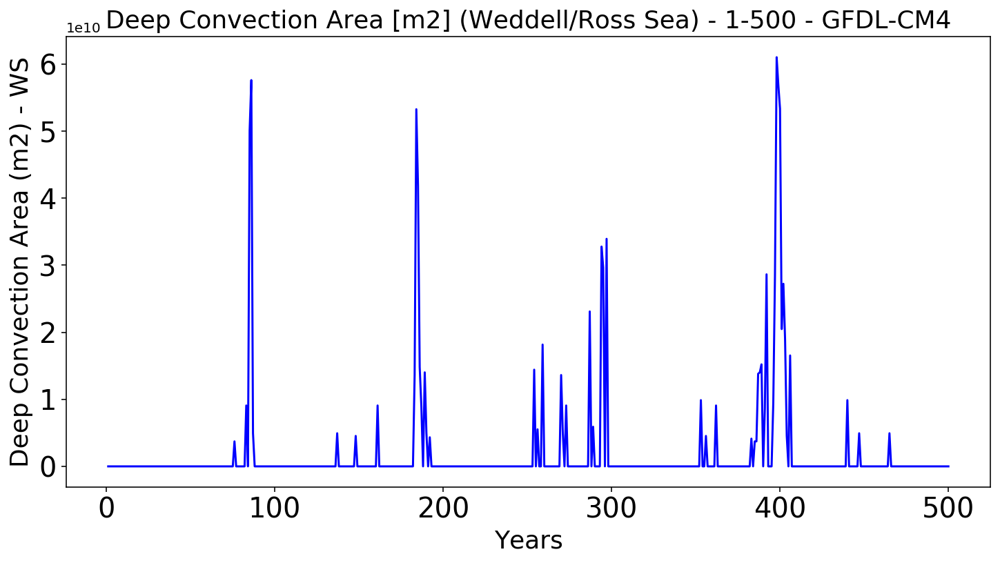

In [51]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
plt.plot(years, Conv_area_timeseries_WS,'b')
plt.xlabel('Years', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.ylabel('Deep Convection Area (m2) - WS', fontsize=18)
plt.title('Deep Convection Area [m2] (Weddell/Ross Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full    
#fig.savefig(dir_figs+str(GCM)+'_deep_conv_area_WS.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

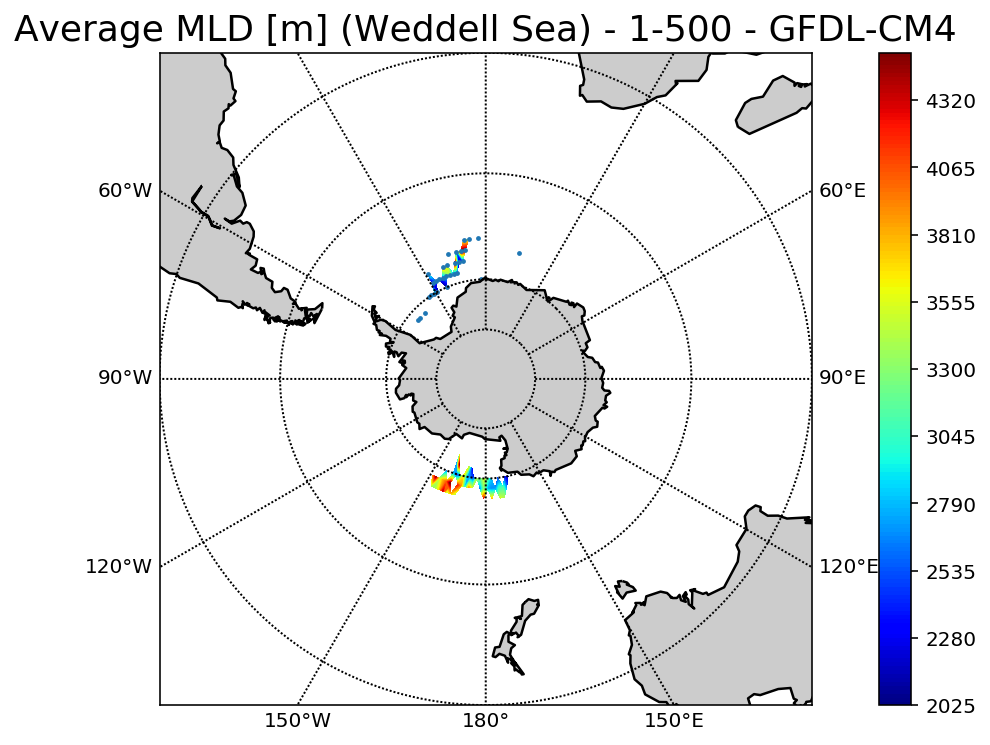

In [55]:
fig=plt.figure()
# if hemis_no==0:
#     m = Basemap( projection='spstere',lon_0=0,boundinglat=-30)
# else:
#     m = Basemap( projection='npstere',lon_0=0,boundinglat=30)
m = Basemap( projection='spstere',lon_0=180,boundinglat=-30)
m.drawcoastlines(linewidth=1.25)
m.fillcontinents(color='0.8')
#m.drawmapboundary(fill_color='#000099')
m.drawparallels(np.arange(-90,90,20), labels=[1,1,0,1])
m.drawmeridians(np.arange(0,360,30), labels=[1,1,0,1])
#lon[lon > 180] -= 360
im=m.contourf(lon_mld_WS,lat_mld_WS,MLD_average_WS,200,latlon=True, cmap=plt.cm.jet)
plt.colorbar(im)
m.scatter(lon_mld_WS[WS_indeces_lonlat],lat_mld_WS[WS_indeces_lonlat],2,latlon=True)
plt.title('Average MLD [m] (Weddell Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
#fig.savefig(dir_figs+str(GCM)+'_average_MLD_WS.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

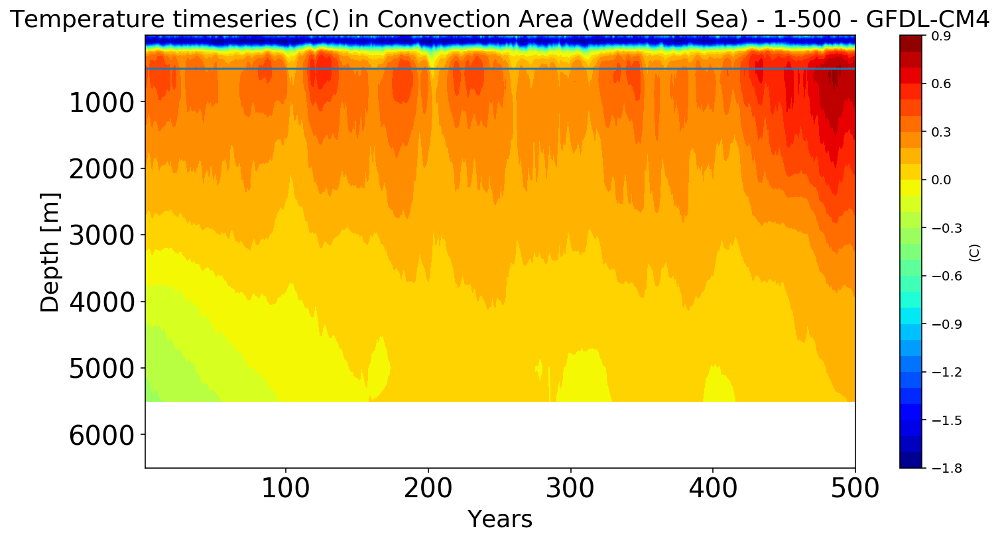

In [57]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths, np.transpose(WS_index_time_depth), 30, cmap=plt.cm.jet) # contour(X,Y,Z,N) - N shows the number of contour levels
plt.gca().invert_yaxis()
l = plt.axhline(y=conv_index_depth_ws)
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Temperature timeseries (C) in Convection Area (Weddell Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
cbar.set_label('(C)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_index_time_depth_WS.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

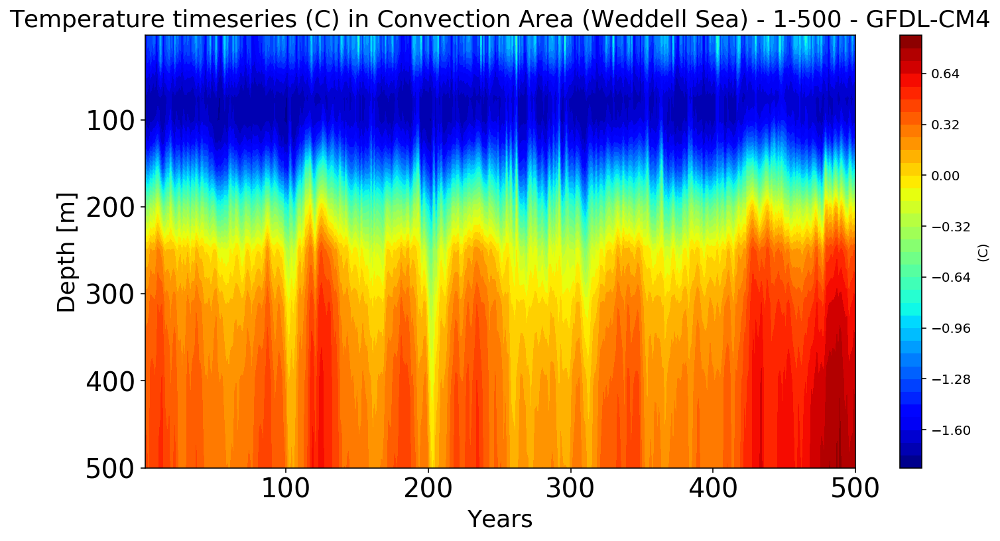

In [58]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths[0:14], np.transpose(WS_index_time_depth[:,0:14]), 40, cmap=plt.cm.jet)
plt.gca().invert_yaxis()
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Temperature timeseries (C) in Convection Area (Weddell Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
#cbar = m.colorbar(im,"right", size="3%", pad="2%", extend='max') # extend='both' will extend the colorbar in both sides (upper side and down side)
cbar.set_label('(C)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_index_time_depth_surface_WS.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

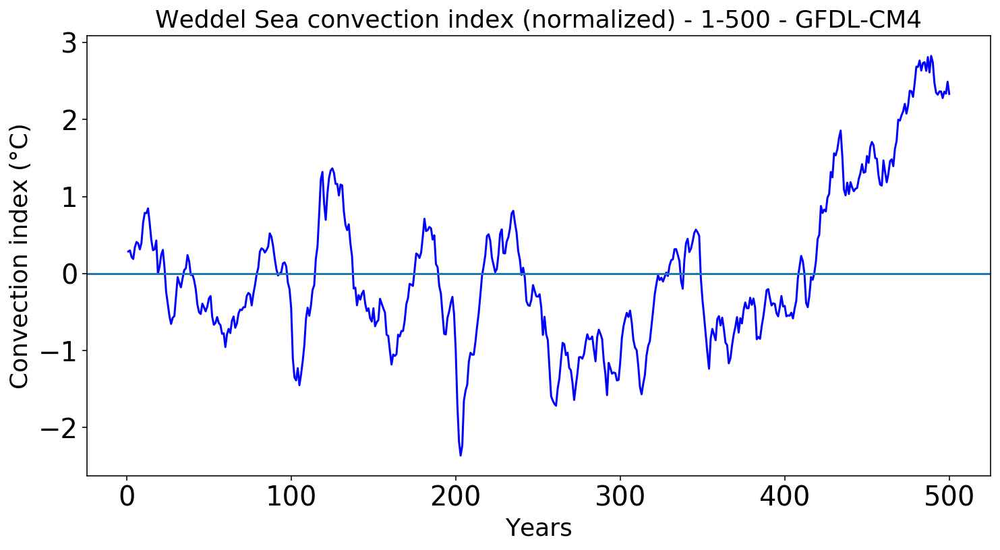

In [59]:
###########################################
### Convection Index Time Series Plots ####
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
#print (years,area)
plt.plot(years,WS_index_norm,'b')
l = plt.axhline(y=0)
#plt.plot(years[st2],deep_conv_area_WS[st2],'r')
plt.xlabel('Years', fontsize=18)
plt.ylabel('Convection index (°C)', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Weddel Sea convection index (normalized) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full    
#fig.savefig(dir_figs+str(GCM)+'_convec_index_WS.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

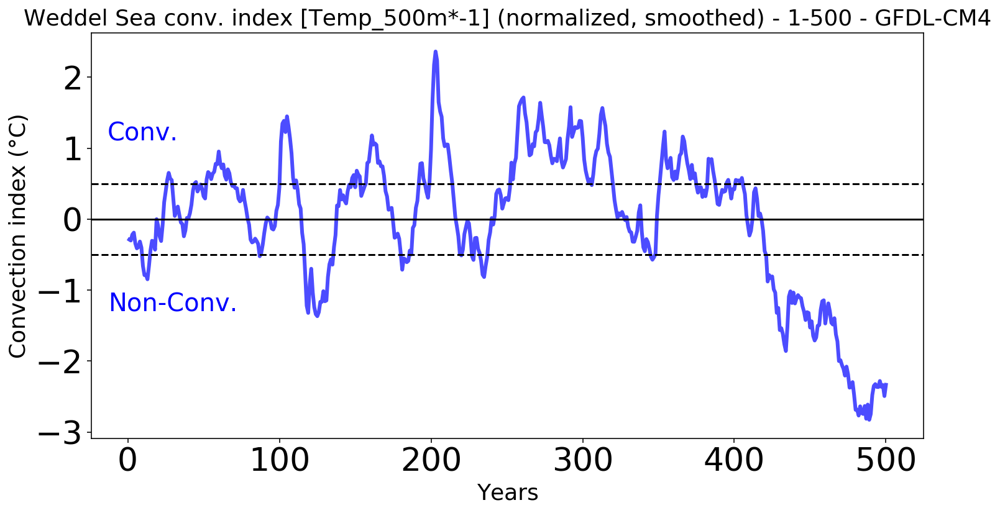

In [169]:
P_Var_x=years
P_Var_y=copy.deepcopy(WS_index_norm) * -1
P_xlable='Years' ;  P_ylable='Convection index (°C)'
P_title='Weddel Sea conv. index [Temp_500m*-1] (normalized, smoothed) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)
fig = func_plotline_1var(P_Var_x, P_Var_y, P_xlable, P_ylable, P_title,  'b', '-')
for l in fig.gca().lines:
    l.set_alpha(0.7)
l = plt.axhline(y=-0.5, color='k', linestyle ='--')
l = plt.axhline(y=0, color='k')
l = plt.axhline(y=0.5, color='k', linestyle ='--')
plt.text(10, 1.2, 'Conv.', horizontalalignment='center', verticalalignment='center', fontsize=20, color='b')
plt.text(30, -1.2, 'Non-Conv.', horizontalalignment='center', verticalalignment='center', fontsize=20, color='b')
#fig.savefig(dir_figs+str(GCM)+'_convec_index_WS_2.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

In [60]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
plt.plot(years, Conv_area_timeseries_ROSS,'b')
plt.xlabel('Years', fontsize=18)
plt.ylabel('Deep Convection Area (m2) - ROSS', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Deep Convection Area [m2] (Ross Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full    
#fig.savefig(dir_figs+str(GCM)+'_deep_conv_area_ROSS.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

NameError: name 'Conv_area_timeseries_ROSS' is not defined

<Figure size 864x432 with 0 Axes>

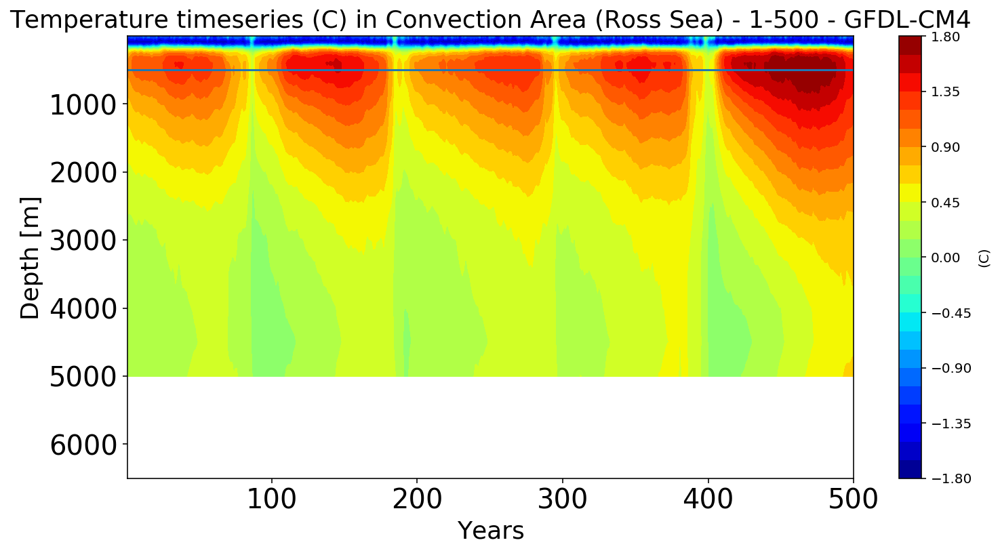

In [62]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths, np.transpose(ROSS_index_time_depth), 30, cmap=plt.cm.jet) # contour(X,Y,Z,N) - N shows the number of contour levels
plt.gca().invert_yaxis()
l = plt.axhline(y=conv_index_depth_ross)
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Temperature timeseries (C) in Convection Area (Ross Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
cbar.set_label('(C)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_index_time_depth_ROSS.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

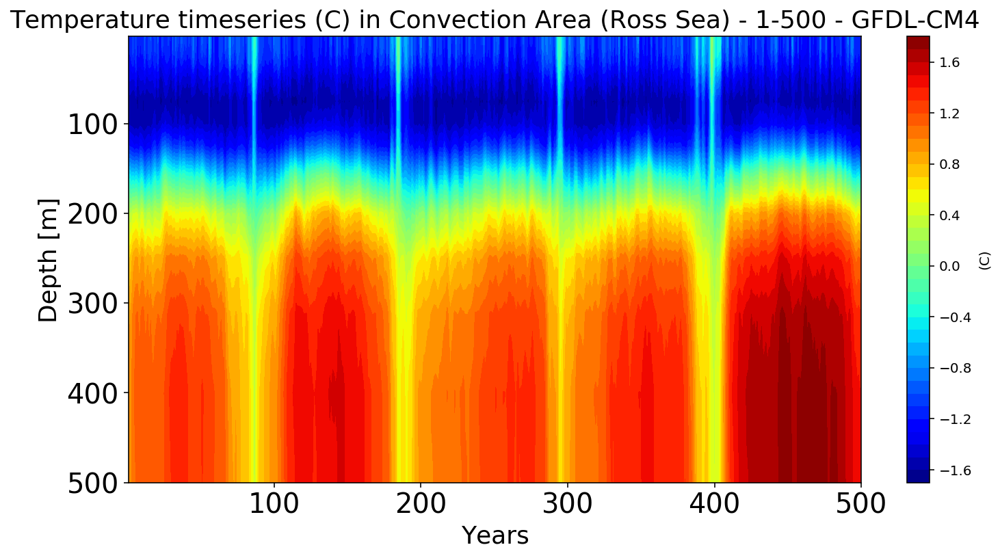

In [63]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths[0:14], np.transpose(ROSS_index_time_depth[:,0:14]), 40, cmap=plt.cm.jet)
plt.gca().invert_yaxis()
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Temperature timeseries (C) in Convection Area (Ross Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
#cbar = m.colorbar(im,"right", size="3%", pad="2%", extend='max') # extend='both' will extend the colorbar in both sides (upper side and down side)
cbar.set_label('(C)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_index_time_depth_surface_ROSS.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

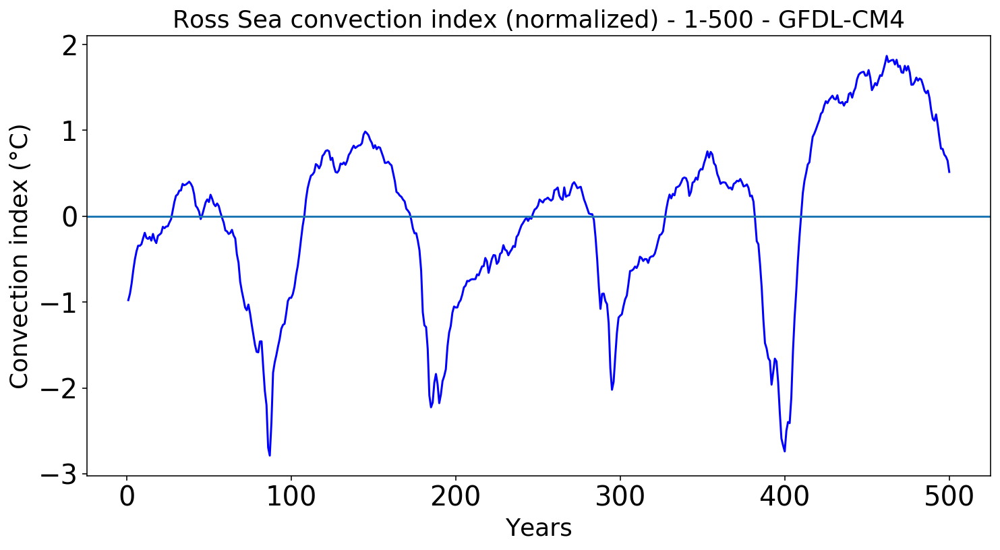

In [64]:
###########################################
### Convection Index Time Series Plots ####
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
#print (years,area)
plt.plot(years,ROSS_index_norm,'b')
l = plt.axhline(y=0)
#plt.plot(years[st2],deep_conv_area_WS[st2],'r')
plt.xlabel('Years', fontsize=18)
plt.ylabel('Convection index (°C)', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Ross Sea convection index (normalized) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full    
#fig.savefig(dir_figs+str(GCM)+'_convec_index_ROSS.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

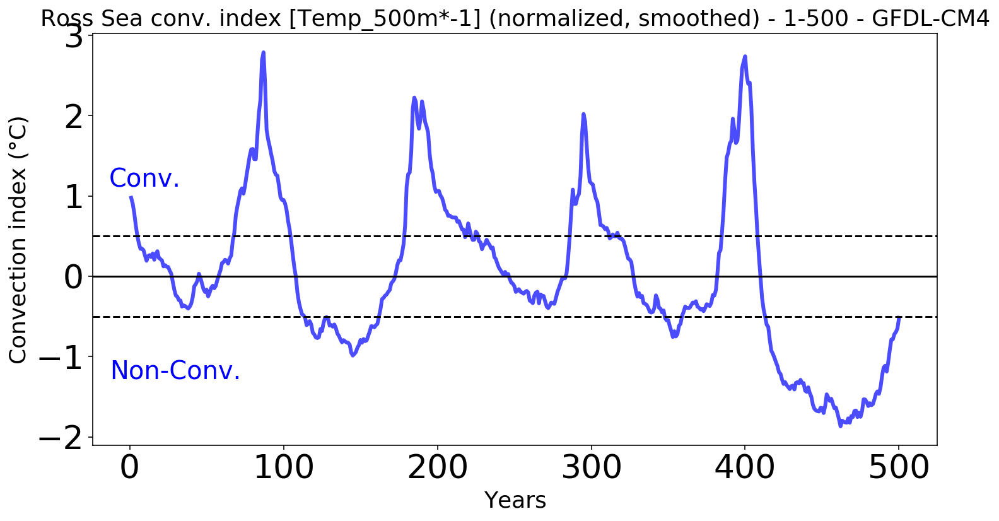

In [39]:
P_Var_x=years
P_Var_y=copy.deepcopy(ROSS_index_norm) * -1
P_xlable='Years' ;  P_ylable='Convection index (°C)'
P_title='Ross Sea conv. index [Temp_500m*-1] (normalized, smoothed) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)
fig = func_plotline_1var(P_Var_x, P_Var_y, P_xlable, P_ylable, P_title,  'b', '-')
for l in fig.gca().lines:
    l.set_alpha(0.7)
l = plt.axhline(y=-0.5, color='k', linestyle ='--')
l = plt.axhline(y=0, color='k')
l = plt.axhline(y=0.5, color='k', linestyle ='--')
plt.text(10, 1.2, 'Conv.', horizontalalignment='center', verticalalignment='center', fontsize=20, color='b')
plt.text(30, -1.2, 'Non-Conv.', horizontalalignment='center', verticalalignment='center', fontsize=20, color='b')
#fig.savefig(dir_figs+str(GCM)+'_convec_index_ROSS_2.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

In [65]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
plt.plot(years, Conv_area_timeseries_LAB,'b')
plt.xlabel('Years', fontsize=18)
plt.ylabel('Deep Convection Area (m2) - LAB', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Deep Convection Area [m2] (Labrador Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full    
#fig.savefig(dir_figs+str(GCM)+'_deep_conv_area_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

NameError: name 'Conv_area_timeseries_LAB' is not defined

<Figure size 864x432 with 0 Axes>

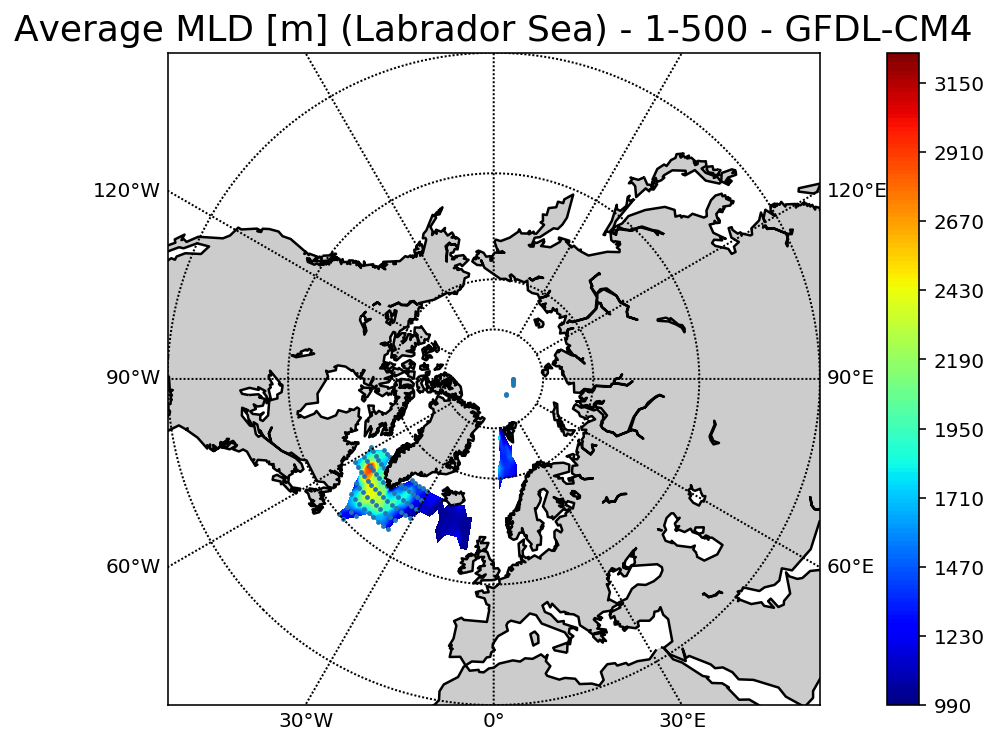

In [132]:
fig=plt.figure()
# if hemis_no==0:
#     m = Basemap( projection='spstere',lon_0=0,boundinglat=-30)
# else:
#     m = Basemap( projection='npstere',lon_0=0,boundinglat=30)
m = Basemap( projection='npstere',lon_0=0,boundinglat=30)
m.drawcoastlines(linewidth=1.25)
m.fillcontinents(color='0.8')
#m.drawmapboundary(fill_color='#000099')
m.drawparallels(np.arange(-90,90,20), labels=[1,1,0,1])
m.drawmeridians(np.arange(0,360,30), labels=[1,1,0,1])
#lon[lon > 180] -= 360
im=m.contourf(lon_mld_LAB,lat_mld_LAB,MLD_average_LAB,200,latlon=True, cmap=plt.cm.jet)
plt.colorbar(im)
m.scatter(lon_mld_LAB[LAB_indeces_lonlat],lat_mld_LAB[LAB_indeces_lonlat],2,latlon=True)
plt.title('Average MLD [m] (Labrador Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
#fig.savefig(dir_figs+str(GCM)+'_average_MLD_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

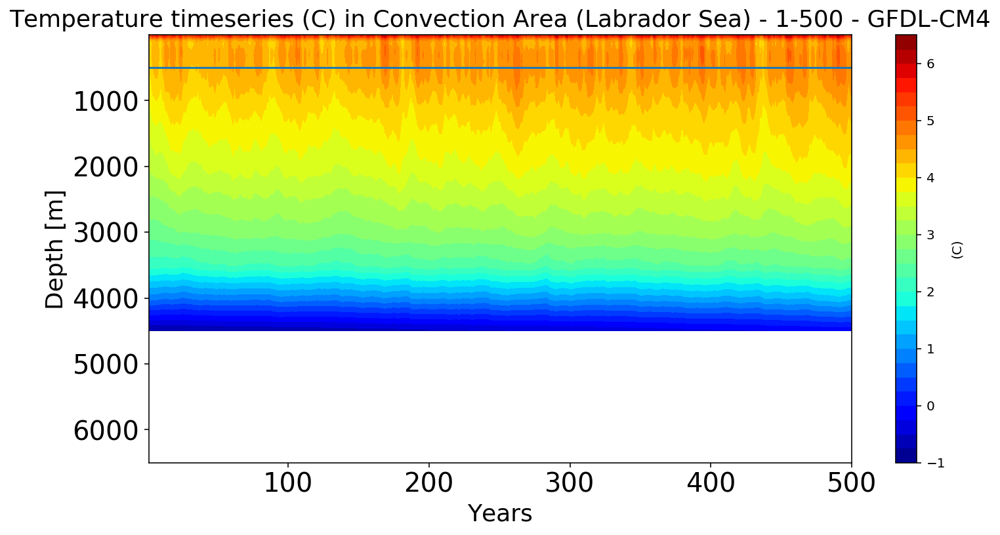

In [67]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths, np.transpose(LAB_index_time_depth), 30, cmap=plt.cm.jet) # contour(X,Y,Z,N) - N shows the number of contour levels
plt.gca().invert_yaxis()
l = plt.axhline(y=conv_index_depth_lab)
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Temperature timeseries (C) in Convection Area (Labrador Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
cbar.set_label('(C)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_index_time_depth_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

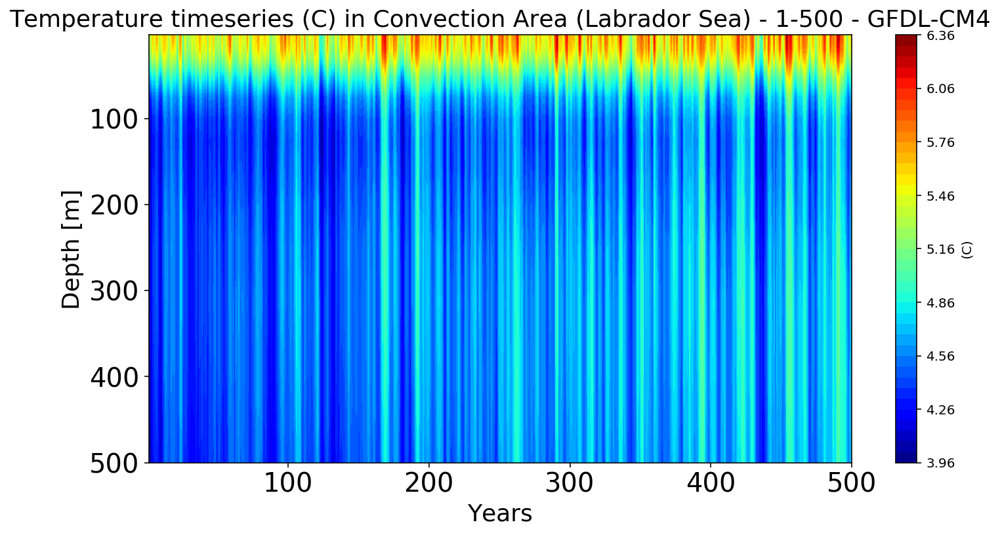

In [68]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths[0:14], np.transpose(LAB_index_time_depth[:,0:14]), 40, cmap=plt.cm.jet)
plt.gca().invert_yaxis()
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Temperature timeseries (C) in Convection Area (Labrador Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
#cbar = m.colorbar(im,"right", size="3%", pad="2%", extend='max') # extend='both' will extend the colorbar in both sides (upper side and down side)
cbar.set_label('(C)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_index_time_depth_surface_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

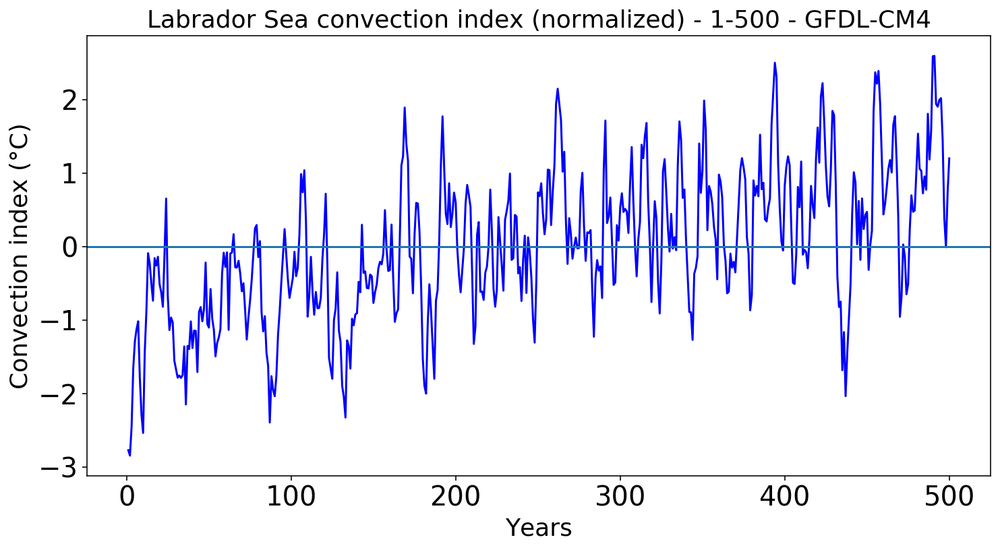

In [69]:
###########################################
### Convection Index Time Series Plots ####
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
#print (years,area)
plt.plot(years,LAB_index_norm,'b')
l = plt.axhline(y=0)
#plt.plot(years[st2],deep_conv_area_WS[st2],'r')
plt.xlabel('Years', fontsize=18)
plt.ylabel('Convection index (°C)', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Labrador Sea convection index (normalized) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full    
#fig.savefig(dir_figs+str(GCM)+'_convec_index_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

In [18]:
def func_calc_Atl_Mask():
    ny, nx = 181, 360
    xmin, xmax = 0, 359
    ymin, ymax = -90, 90
    xi = np.linspace(xmin, xmax, nx)
    yi = np.linspace(ymin, ymax, ny)
    lon, lat = np.meshgrid(xi, yi)
    [i,j] = np.where(np.logical_or(
                       np.logical_or((lat<=12) & (lon>=0) & (20>=lon),(lat<=12) & (290<=lon)& (lon<=360)),#### SH indeces
                       np.logical_or((lat>12) & (lon>=0) & (20>=lon),(lat>12) & (270<=lon) & (lon<=360))))#### NH indeces####
    return [i,j]

def func_stream(ds_vo):
  
    depths=ds_vo.lev.values
    ### these are upper and lower depths of each cell in an ocean grid
    depths_b=ds_vo.lev_bnds.values
    ### calculate the depth of each cell in an ocean grid
    depths_r=depths_b[:,1]-depths_b[:,0]
    ### find timeindeces
    yrs_no = np.int(len(ds_vo.time)/12)
    
    Lon_orig=ds_vo.lon.values
    Lat_orig=ds_vo.lat.values    

    Lon_orig = np.array(Lon_orig).copy() # To solve the issue with imuutability of the variable (ValueError: assignment destination is read-only)
    Lat_orig = np.array(Lat_orig).copy()
    
    transport_lon_final=[] # SUM(V_y * dX * dZ) over longitudes, for all years
    transport_final=[]
    transport_0_1000=[]
    transport_1000_2000=[]
    transport_2000_3000=[]
    transport_3000_4000=[]
    transport_4000_5000=[]
    transport_5000_below=[]
    
    Depth_indx=np.zeros((5,4)) # Rows: Depths of 1000, 2000, 3000, 4000 and 5000 meters
                               # Columns: 0=row number, 1=depths, 2=depths lower range, 3=depths upper range   
        
    for dd in range(depths.shape[0]):
        if (depths_b[dd,0] < 1000) and (depths_b[dd,1] > 1000):
            Depth_indx[0,0]=dd; Depth_indx[0,1]=depths[dd]
            Depth_indx[0,2]=depths_b[dd,0]; Depth_indx[0,3]=depths_b[dd,1]
        if (depths_b[dd,0] < 2000) and (depths_b[dd,1] > 2000):
            Depth_indx[1,0]=dd; Depth_indx[1,1]=depths[dd]
            Depth_indx[1,2]=depths_b[dd,0]; Depth_indx[1,3]=depths_b[dd,1]
        if (depths_b[dd,0] < 3000) and (depths_b[dd,1] > 3000):
            Depth_indx[2,0]=dd; Depth_indx[2,1]=depths[dd]
            Depth_indx[2,2]=depths_b[dd,0]; Depth_indx[2,3]=depths_b[dd,1]
        if (depths_b[dd,0] < 4000) and (depths_b[dd,1] > 4000):
            Depth_indx[3,0]=dd; Depth_indx[3,1]=depths[dd]
            Depth_indx[3,2]=depths_b[dd,0]; Depth_indx[3,3]=depths_b[dd,1]
        if (depths_b[dd,0] < 5000) and (depths_b[dd,1] > 5000):
            Depth_indx[4,0]=dd; Depth_indx[4,1]=depths[dd]
            Depth_indx[4,2]=depths_b[dd,0]; Depth_indx[4,3]=depths_b[dd,1]

    lat_n_regrid=180
    lon_n_regrid=360
    Lat_regrid_1D, Lon_regrid_1D, Lat_bound_regrid, Lon_bound_regrid = func_latlon_regrid_eq(lat_n_regrid, lon_n_regrid, -90, 90, 0, 360)
    lon, lat = np.meshgrid(Lon_regrid_1D, Lat_regrid_1D)

    mask_atl=func_calc_Atl_Mask()           
        
    ### Averaging velocities over the year for monthly data
    for t in tqdm(range(yrs_no)):
        #print ('Stream calc - Year: ', t+1)
        data_vo_extracted=ds_vo.vo.isel(time= slice(12*t,12*t+11) ).values
        data=np.squeeze(data_vo_extracted)
        data=np.mean(data, axis=0)
        
        data_i = func_regrid(data, Lat_orig, Lon_orig, lat, lon)
        data_i[np.abs(data_i)>1e16]=np.nan # converting 1e+20 to nan

        if t==0: 
            data_depth=np.full([len(lon),len(lon[0])], np.nan)
            data_depth_ranges=np.full([len(data_i),len(data_i[0]),len(data_i[0][0])], np.nan)
        [ii,jj] = mask_atl
        for k in range(len(ii)):
            #### I calculate the depth by looking how many nans is in the depth column
            if sum(~np.isnan(data_i[:,ii[k],jj[k]]))>0:
                if t==0:
                    data_depth[ii[k],jj[k]]=depths[sum(~np.isnan(data_i[:,ii[k],jj[k]]))-1]
                    for l in range(sum(~np.isnan(data_i[:,ii[k],jj[k]]))):
                        data_depth_ranges[l,ii[k],jj[k]]=depths_r[l]        

        
        #### calculating volume transport
        #### first multiplying by 111km*cos(lat)
        mul_by_lat=data_i*(np.cos(np.deg2rad(lat))*111321) # V_y * dX [Unit: m/s * m]
        #### second multiplying by depth
        transport=mul_by_lat*data_depth_ranges/1000000 # V_y * dX * dZ [Unit: m/s * m * m * 1e-6 = Sverdrup]
        #### calculating integral over dz
        transport_lon=np.nansum(transport,axis=2) # SUM(V_y * dX * dZ) over longitudes [Unit: m3/s * 1e-6 = Sverdrup]
        #### calculating cum integral over dz
        #stream=np.nancumsum(transport_lon,axis=0)
        transport_lon_final.append(transport_lon) # SUM(V_y * dX * dZ) over longitudes, for all years
        transport_0_1000.append(np.nanmean(transport[0:int(Depth_indx[0,0])+1,:,:],axis=0))
        transport_1000_2000.append(np.nanmean(transport[int(Depth_indx[0,0])+1:int(Depth_indx[1,0])+1,:,:],axis=0))        
        transport_2000_3000.append(np.nanmean(transport[int(Depth_indx[1,0])+1:int(Depth_indx[2,0])+1,:,:],axis=0))
        transport_3000_4000.append(np.nanmean(transport[int(Depth_indx[2,0])+1:int(Depth_indx[3,0])+1,:,:],axis=0))
        transport_4000_5000.append(np.nanmean(transport[int(Depth_indx[3,0])+1:int(Depth_indx[4,0])+1,:,:],axis=0))
        if depths.shape[0] - (int(Depth_indx[4,0])+1) ==1:
            transport_5000_below.append(transport[int(Depth_indx[4,0])+1,:,:])
        elif depths.shape[0] - (int(Depth_indx[4,0])+1) >=2:
            transport_5000_below.append(np.nanmean(transport[int(Depth_indx[4,0])+1:,:,:],axis=0))
        
        #transport_final.append(transport)
    transport_lon_final=np.asarray(transport_lon_final)

    transport_0_1000=np.asarray(transport_0_1000)
    transport_1000_2000=np.asarray(transport_1000_2000)      
    transport_2000_3000=np.asarray(transport_2000_3000)
    transport_3000_4000=np.asarray(transport_3000_4000)
    transport_4000_5000=np.asarray(transport_4000_5000)
    transport_5000_below=np.asarray(transport_5000_below)

    transport_0_1000_mean=np.nanmean(transport_0_1000,axis=0)
    transport_2000_3000_mean=np.nanmean(transport_2000_3000,axis=0)

    maxvals=np.nanmax(transport_0_1000_mean,axis=1)
    minvals=np.nanmin(transport_2000_3000_mean,axis=1)

    ind_max = np.array([np.argwhere(transport_0_1000_mean == [x]) for x in maxvals])
    ind_max=np.concatenate(ind_max).astype(None)
    ind_max=np.concatenate(ind_max).astype(None)
    ii_max=ind_max[0::2].astype(int)
    jj_max=ind_max[1::2].astype(int)
    ind_min = np.array([np.argwhere(transport_2000_3000_mean == [x]) for x in minvals])
    ind_min=np.concatenate(ind_min).astype(None)
    ind_min=np.concatenate(ind_min).astype(None)
    ii_min=ind_min[0::2].astype(int)
    jj_min=ind_min[1::2].astype(int)

    return transport_lon_final, transport_0_1000, transport_1000_2000, transport_2000_3000, transport_3000_4000, transport_4000_5000, transport_5000_below, data_depth, Depth_indx, lon, lat, ii_max,jj_max, ii_min, jj_min, transport_0_1000_mean, transport_2000_3000_mean
        
        

In [ ]:
#############################################################################
###### YOU DON'T NEED TO RUN THIS SECTION AS IT WILL TAKE A WHILE 
###### MOVE A FEW CELL DOWN WHERE IT SAYS "To restore:", AND RUN THAT
###### THIS WILL LOAD THE RESULTS TAHT ARE PREVIOUSLY CALCULATED AND MOVE ON TO PLOTS
#############################################################################

In [ ]:
df_plt = df[(df.variable_id == 'vo') & (df.experiment_id == 'piControl')& (df.source_id=='GFDL-CM4')]
#df_plt = df_plt[ df_plt['grid_label'] == 'gr']
run_counts = df_plt.groupby(['source_id', 'experiment_id'])['zstore'].count()
run_counts

In [ ]:
uri_vo = df_plt[(df_plt.source_id == GCM_name)].zstore.values[0]
uri_vo

In [ ]:
ds_vo = func_load_ds_uri(uri_vo)
ds_vo

In [ ]:
Transport_lon_final, transport_0_1000, transport_1000_2000, transport_2000_3000, transport_3000_4000, transport_4000_5000, transport_5000_below, latlon_depths, Depth_indx, lon_stream, lat_stream, ii_max,jj_max, ii_min, jj_min, transport_0_1000_mean, transport_2000_3000_mean  = func_stream(ds_vo)

In [ ]:
transport_1000_2000_mean=np.nanmean(transport_1000_2000,axis=0)
transport_3000_4000_mean=np.nanmean(transport_3000_4000,axis=0)
transport_4000_5000_mean=np.nanmean(transport_4000_5000,axis=0)
transport_5000_below_mean=np.nanmean(transport_5000_below,axis=0)

transport_1000_below_mean = np.mean( np.array([transport_1000_2000_mean, transport_2000_3000_mean, transport_3000_4000_mean, transport_4000_5000_mean, transport_5000_below_mean ]), axis=0 )


In [ ]:
###################################
### Streamfunction calculations ###
Stream_function=np.empty((Transport_lon_final.shape[0], Transport_lon_final.shape[1], Transport_lon_final.shape[2]))*np.nan # streamfunction
Stream_function[:,0,:]=Transport_lon_final[:,0,:]
for ii in range(1,Stream_function.shape[1]): # Depths
    Stream_function[:,ii,:]=Stream_function[:,ii-1,:]+Transport_lon_final[:,ii,:]

stfunc_sum=np.nansum(Transport_lon_final,axis=1)
for ii in range(1,Stream_function.shape[1]): # Depths
    Stream_function[:,ii,:]=Stream_function[:,ii,:] - stfunc_sum

In [ ]:
Stream_function_ave=np.nanmean(Stream_function, axis=0) # Stream Function averaged over the years
AMOC_max=np.nanmax(Stream_function, axis=1)
SMOC_min=np.nanmin(Stream_function, axis=1)

In [ ]:
Transport_lon_final_mean=np.nanmean(Transport_lon_final, axis=0) #  just transport
Transport_lon_final_mean=np.asarray(Transport_lon_final_mean)
Transport_lon_final_mean=np.squeeze(Transport_lon_final_mean)

In [ ]:
# var_list_short=['Transport_lon_final', 'transport_0_1000', 'transport_1000_2000', 'transport_2000_3000', 'transport_3000_4000', 'transport_4000_5000', 
#                 'transport_5000_below', 'latlon_depths', 'Depth_indx', 'lon_stream', 'lat_stream', 'ii_max', 'jj_max', 'ii_min', 'jj_min', 
#                 'transport_0_1000_mean', 'transport_2000_3000_mean', 'transport_1000_2000_mean', 'transport_3000_4000_mean' , 'transport_4000_5000_mean',
#                 'transport_5000_below_mean', 'transport_1000_below_mean', 'Stream_function', 'Stream_function_ave', 'AMOC_max', 'SMOC_min',
#                 'Transport_lon_final_mean', 'year_end', 'year_start']
# ###############################################################################
# ###########                 Saving Results                #####################
# import os
# import shelve

# dir_pwd = os.getcwd() # Gets the current directory (and in which the code is placed)
# filename_out = (dir_pwd + '/AllResults_'+GCM+'_500yr_trans.out') # Directory to save processed data

# ### To save
# my_shelf = shelve.open(filename_out,'n') # 'n' for new

# for key in var_list_short:
#     try:
#         my_shelf[key] = globals()[key]
#     except TypeError:
#         print('ERROR shelving: {0}'.format(key))
# my_shelf.close()


In [25]:
#############################################################################
################        To restore:        ##################################
import os
import shelve

dir_pwd = os.getcwd() # Gets the current directory (and in which the code is placed)
filename_out = (dir_pwd + '/AllResults_'+GCM+'_500yr_trans.out') # Directory to save processed data

my_shelf = shelve.open(filename_out)
for key in my_shelf:
    globals()[key]=my_shelf[key]
my_shelf.close()

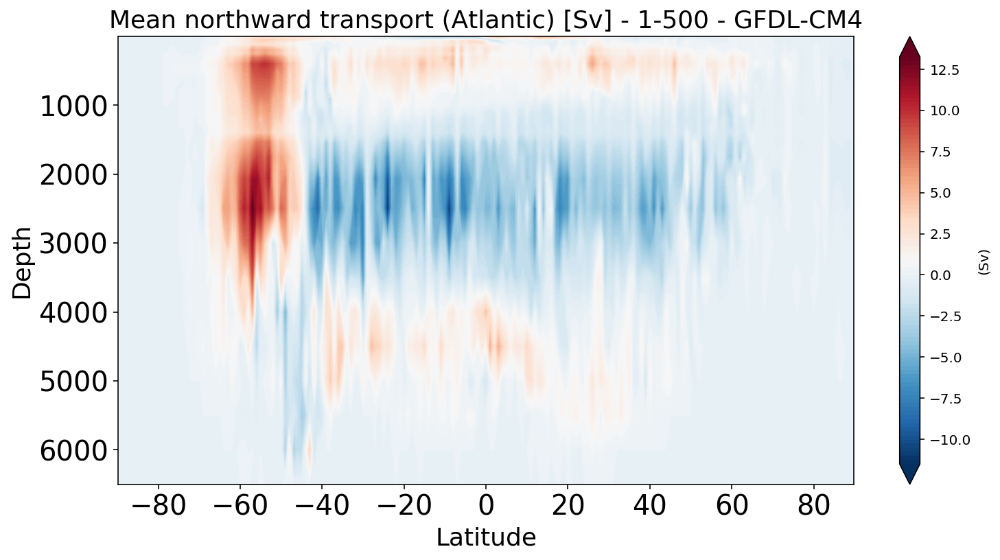

In [70]:
#plot #1, just transport
fig=plt.figure()
im=plt.contourf(Lat_regrid_1D, Depths, Transport_lon_final_mean, 100, cmap=plt.cm.RdBu_r, extend = 'both')
plt.gca().invert_yaxis()
plt.xlabel('Latitude', fontsize=18)
plt.ylabel('Depth', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Mean northward transport (Atlantic) [Sv] - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
cbar.set_label('(Sv)')
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_Transport_lon_final_mean.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

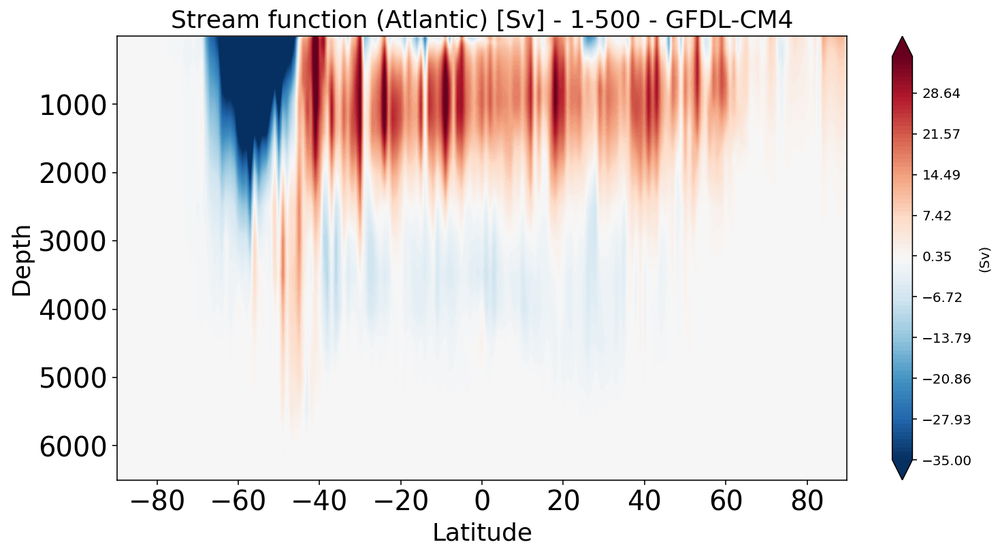

In [71]:
levels=np.linspace(-35,35,100) 
#plot #2, streamfunction
fig=plt.figure()
im=plt.contourf(Lat_regrid_1D, Depths, Stream_function_ave, levels, cmap=plt.cm.RdBu_r, extend = 'both')
plt.gca().invert_yaxis()
plt.xlabel('Latitude', fontsize=18)
plt.ylabel('Depth', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Stream function (Atlantic) [Sv] - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
cbar.set_label('(Sv)')
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_Stream_function_ave.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

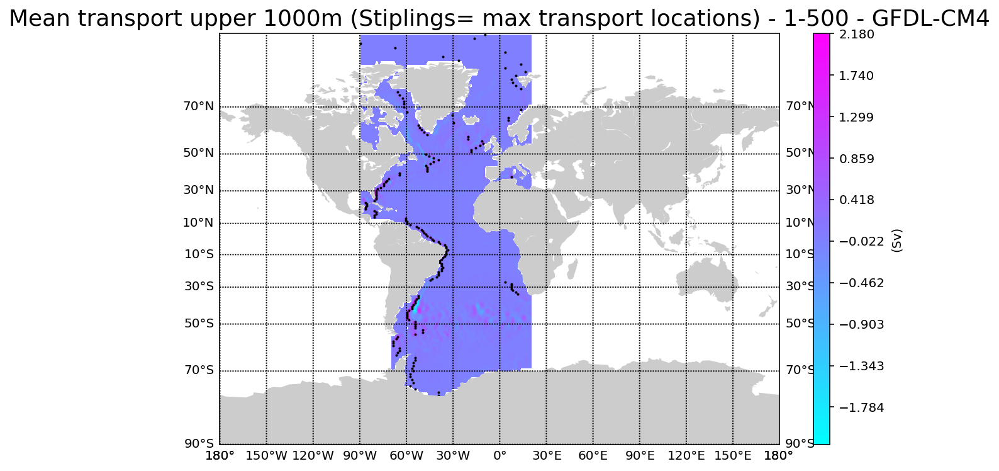

In [29]:
#plot #3, map of mean transport upper 1000m with indeces of max for each lat
fig=plt.figure()
m = Basemap( projection='mill',lon_0=0)
m.fillcontinents(color='0.8')
m.drawparallels(np.arange(-90,90,20), labels=[1,1,0,1])
m.drawmeridians(np.arange(0,360,30), labels=[1,1,0,1])
bounds_max=float("{0:.02f}".format(np.nanpercentile(transport_0_1000_mean, 99.9))) # Upper bound of plotted values to be used for colorbar, which is 98th percentile of data, with 2 decimals
levels=np.linspace(-1*bounds_max,bounds_max,100)  
im=m.contourf(lon_stream,lat_stream,transport_0_1000_mean,levels,latlon=True, cmap=plt.cm.cool)
m.scatter(Lon_regrid_2D[ii_max,jj_max], Lat_regrid_2D[ii_max,jj_max],1,c='k',latlon=True)
cbar = m.colorbar(im,"right", size="3%", pad="6%", extend = 'both') # extend='both' will extend the colorbar in both sides (upper side and down side)
cbar.set_label('(Sv)')
plt.title('Mean transport upper 1000m (Stiplings= max transport locations) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_transport_0_1000_mean_stiple.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

Text(0.5, 1.0, 'Mean transport 2000-3000m (Stiplings= min transport locations) - 1-500 - GFDL-CM4')

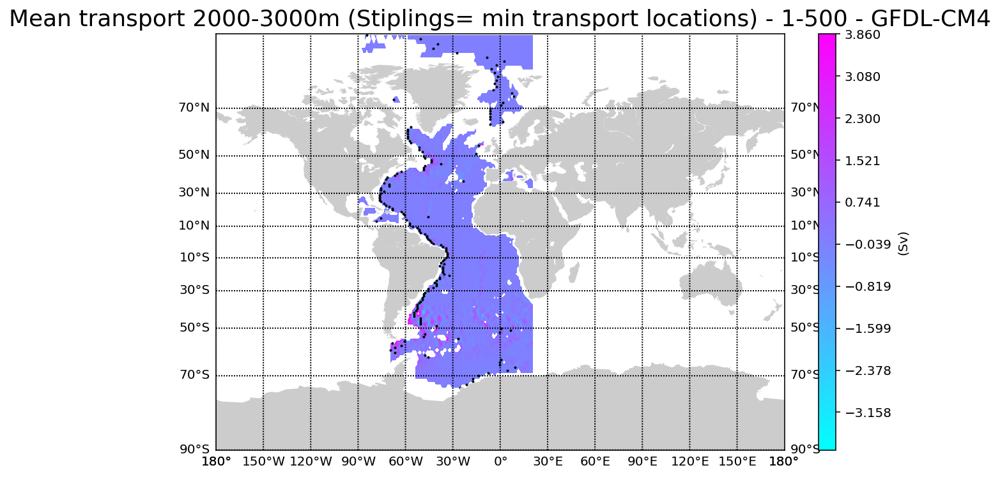

In [30]:
#plot #4, map of mean transport 2000m-3000m with indeces of max for each lat
fig=plt.figure()
m = Basemap( projection='mill',lon_0=0)
m.fillcontinents(color='0.8')
m.drawparallels(np.arange(-90,90,20), labels=[1,1,0,1])
m.drawmeridians(np.arange(0,360,30), labels=[1,1,0,1])
bounds_max=float("{0:.02f}".format(np.nanpercentile(transport_2000_3000_mean, 99.9))) # Upper bound of plotted values to be used for colorbar, which is 98th percentile of data, with 2 decimals
levels=np.linspace(-1*bounds_max,bounds_max,100)  
im=m.contourf(lon_stream,lat_stream,transport_2000_3000_mean,levels,latlon=True, cmap=plt.cm.cool)
m.scatter(Lon_regrid_2D[ii_min,jj_min], Lat_regrid_2D[ii_min,jj_min],1,c='k',latlon=True)
cbar = m.colorbar(im,"right", size="3%", pad="6%", extend = 'both') # extend='both' will extend the colorbar in both sides (upper side and down side)
cbar.set_label('(Sv)')
plt.title('Mean transport 2000-3000m (Stiplings= min transport locations) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
#mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_transport_2000_3000_mean_stiple.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

In [26]:
WS_index_rm = copy.deepcopy(WS_index)

#multiplying by -1 as we have convection when temperature is low(opposite to the index which we calculate)
WS_index_rm=runningMeanFast(WS_index_rm, 10)
WS_index_rm=WS_index_rm*(-1)

In [27]:
ROSS_index_rm = copy.deepcopy(ROSS_index)

#multiplying by -1 as we have convection when temperature is low(opposite to the index which we calculate)
ROSS_index_rm=runningMeanFast(ROSS_index_rm, 10)
ROSS_index_rm=ROSS_index_rm*(-1)

In [28]:
LAB_index_rm = copy.deepcopy(LAB_index)

LAB_index_rm=runningMeanFast(LAB_index_rm, 10)

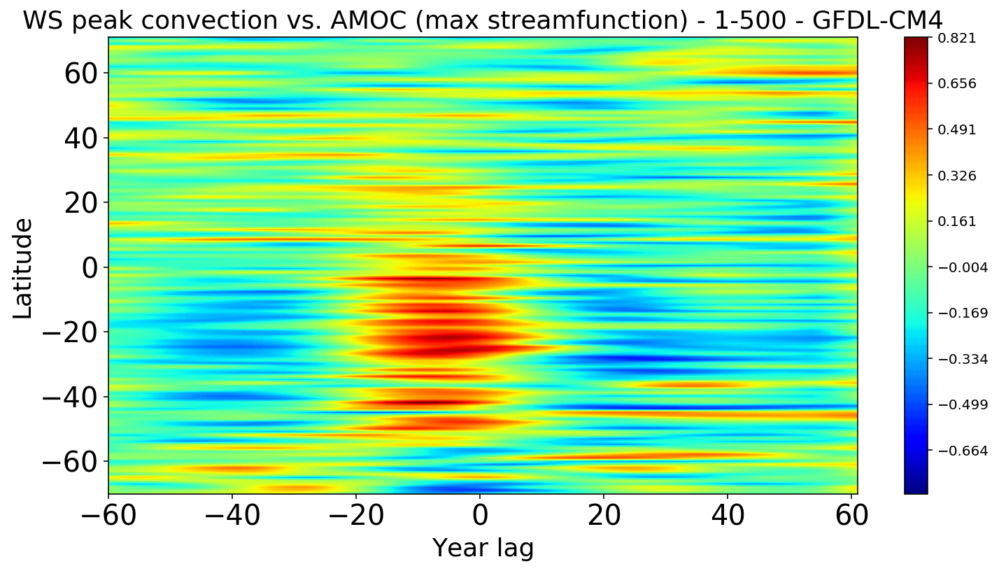

In [73]:
#### WS plots ####
lag_time=60

fig=plt.figure()
data=[]
for i in range(len(AMOC_max[0][20:161])):
    stream=runningMeanFast(AMOC_max[:,i+35], 10)
    r=lag_cor_data(WS_index_rm,stream,lag_time)
    data.append(r)
data=np.asarray(data)
x=np.linspace(-lag_time,lag_time+1, 2*lag_time)
y=np.linspace(-70,70+1, 2*70+1)

x,y=np.meshgrid(x,y)
cmap_limit=np.nanmax(np.abs(data))
levels=np.linspace(-cmap_limit,cmap_limit,200)
im=plt.contourf(x,y,data,levels,latlon=True, cmap=plt.cm.jet)
cb = plt.colorbar(im)
plt.xlabel('Year lag', fontsize=18)
plt.ylabel('Latitude', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('WS peak convection vs. AMOC (max streamfunction) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_lagcor_convec_AMOC_max_WS_2.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

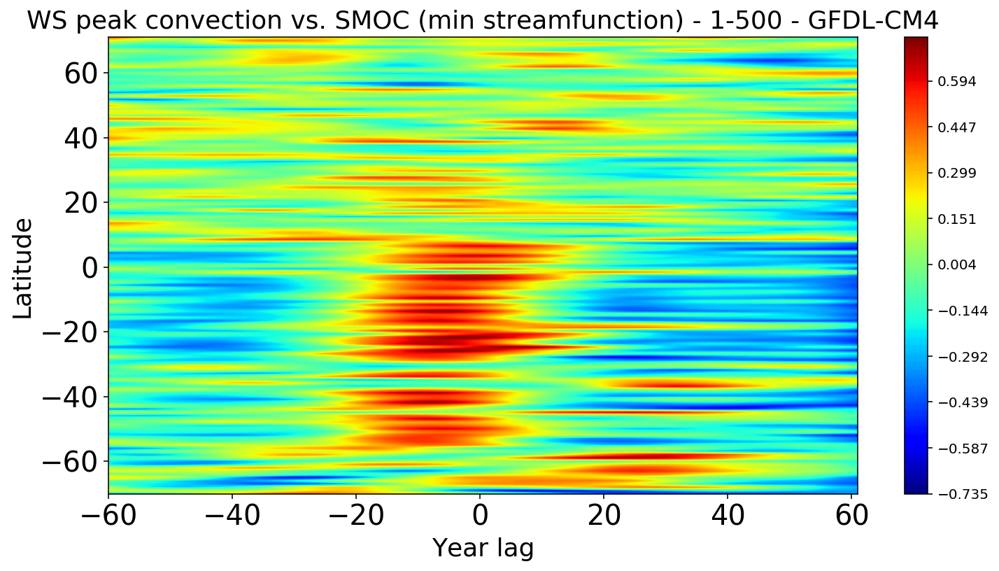

In [76]:
fig=plt.figure()
data=[]
for i in range(len(SMOC_min[0][20:161])):
    stream=runningMeanFast(SMOC_min[:,i+35], 10)
    r=lag_cor_data(WS_index_rm,stream,lag_time)
    data.append(r)
data=np.asarray(data)
x=np.linspace(-lag_time,lag_time+1, 2*lag_time)
y=np.linspace(-70,70+1, 2*70+1)

x,y=np.meshgrid(x,y)
cmap_limit=np.nanmax(np.abs(data))
levels=np.linspace(-cmap_limit,cmap_limit,200)
im=plt.contourf(x,y,data,levels,latlon=True, cmap=plt.cm.jet)
cb = plt.colorbar(im)
plt.xlabel('Year lag', fontsize=18)
plt.ylabel('Latitude', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('WS peak convection vs. SMOC (min streamfunction) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_lagcor_convec_SMOC_min_WS_2.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

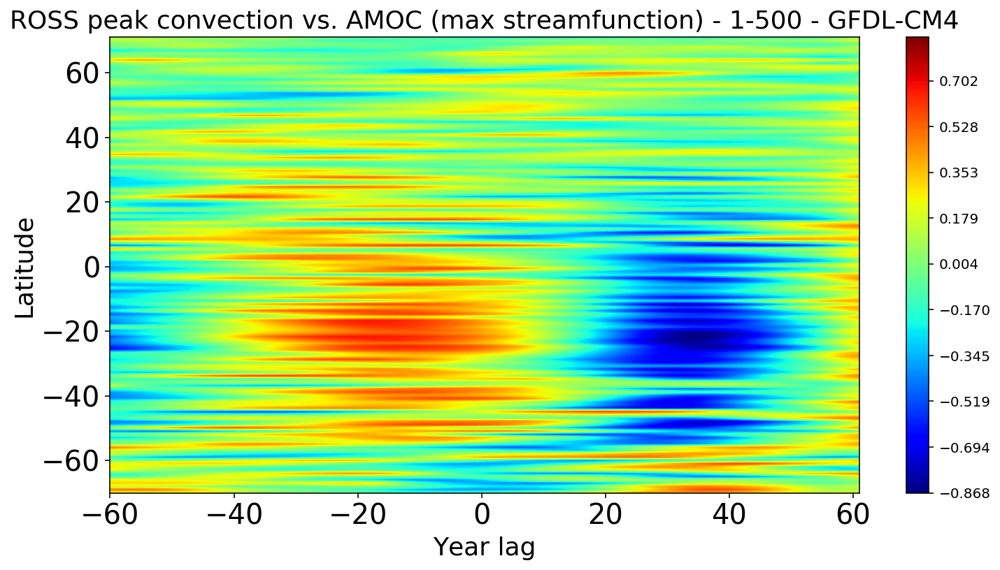

In [80]:
#### Ross plots ####
lag_time=60

fig=plt.figure()
data=[]
for i in range(len(AMOC_max[0][20:161])):
    stream=runningMeanFast(AMOC_max[:,i+35], 10)
    r=lag_cor_data(ROSS_index_rm,stream,lag_time)
    data.append(r)
data=np.asarray(data)
x=np.linspace(-lag_time,lag_time+1, 2*lag_time)
y=np.linspace(-70,70+1, 2*70+1)

x,y=np.meshgrid(x,y)
cmap_limit=np.nanmax(np.abs(data))
levels=np.linspace(-cmap_limit,cmap_limit,200)
im=plt.contourf(x,y,data,levels,latlon=True, cmap=plt.cm.jet)
cb = plt.colorbar(im)
plt.xlabel('Year lag', fontsize=18)
plt.ylabel('Latitude', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('ROSS peak convection vs. AMOC (max streamfunction) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_lagcor_convec_AMOC_max_ROSS_2.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

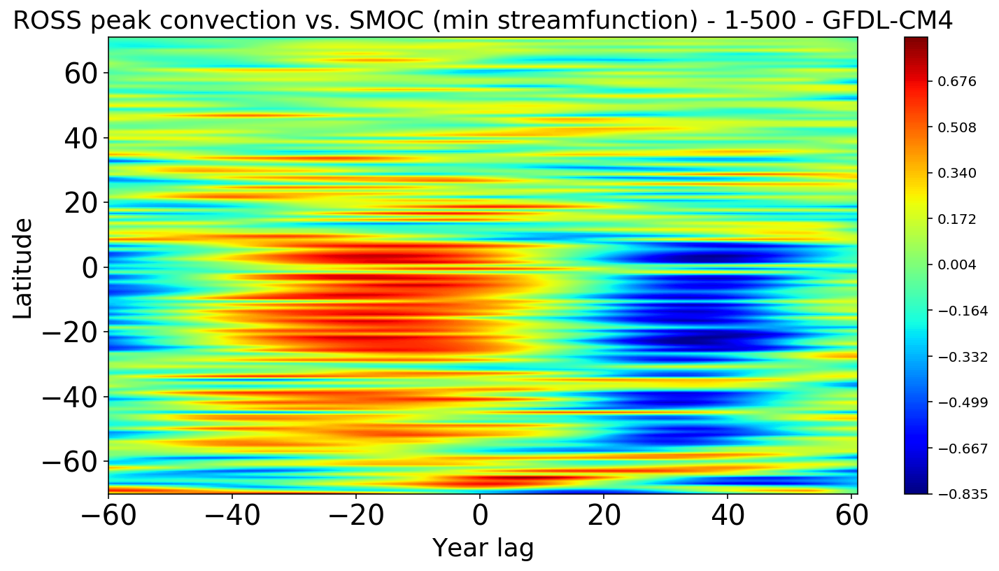

In [81]:
fig=plt.figure()
data=[]
for i in range(len(SMOC_min[0][20:161])):
    stream=runningMeanFast(SMOC_min[:,i+35], 10)
    r=lag_cor_data(ROSS_index_rm,stream,lag_time)
    data.append(r)
data=np.asarray(data)
x=np.linspace(-lag_time,lag_time+1, 2*lag_time)
y=np.linspace(-70,70+1, 2*70+1)

x,y=np.meshgrid(x,y)
cmap_limit=np.nanmax(np.abs(data))
levels=np.linspace(-cmap_limit,cmap_limit,200)
im=plt.contourf(x,y,data,levels,latlon=True, cmap=plt.cm.jet)
cb = plt.colorbar(im)
plt.xlabel('Year lag', fontsize=18)
plt.ylabel('Latitude', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('ROSS peak convection vs. SMOC (min streamfunction) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_lagcor_convec_SMOC_min_ROSS_2.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

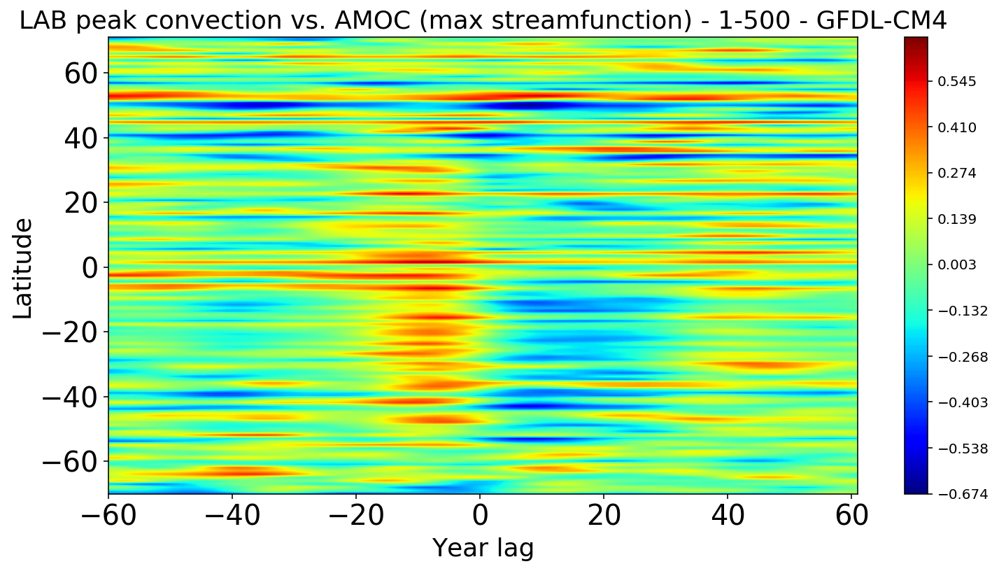

In [82]:
#### LAB plots ####
lag_time=60

fig=plt.figure()
data=[]
for i in range(len(AMOC_max[0][20:161])):
    stream=runningMeanFast(AMOC_max[:,i+35], 10)
    r=lag_cor_data(LAB_index_rm,stream,lag_time)
    data.append(r)
data=np.asarray(data)
x=np.linspace(-lag_time,lag_time+1, 2*lag_time)
y=np.linspace(-70,70+1, 2*70+1)

x,y=np.meshgrid(x,y)
cmap_limit=np.nanmax(np.abs(data))
levels=np.linspace(-cmap_limit,cmap_limit,200)
im=plt.contourf(x,y,data,levels,latlon=True, cmap=plt.cm.jet)
cb = plt.colorbar(im)
plt.xlabel('Year lag', fontsize=18)
plt.ylabel('Latitude', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('LAB peak convection vs. AMOC (max streamfunction) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_lagcor_convec_AMOC_max_LAB_2.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

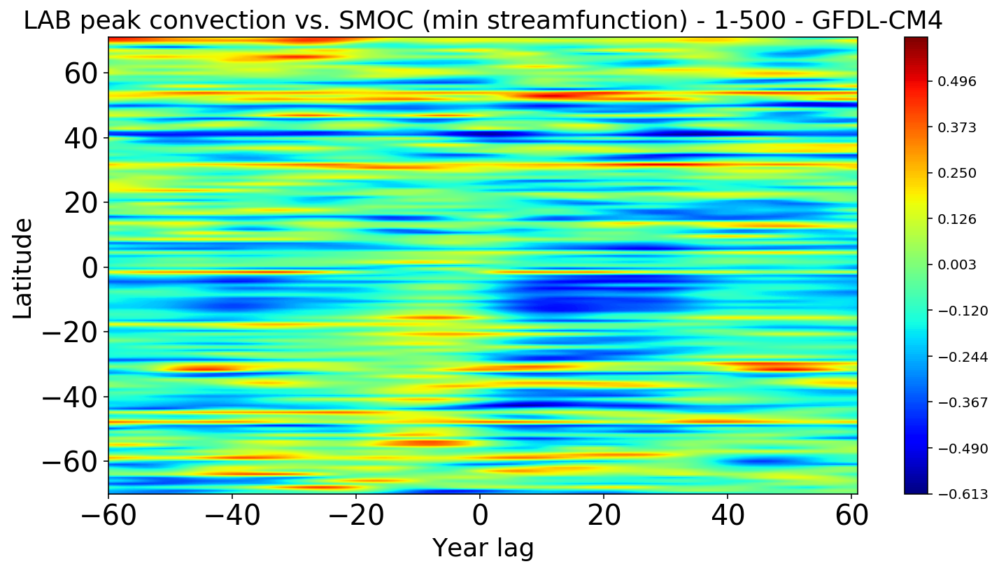

In [83]:
fig=plt.figure()
data=[]
for i in range(len(SMOC_min[0][20:161])):
    stream=runningMeanFast(SMOC_min[:,i+35], 10)
    r=lag_cor_data(LAB_index_rm,stream,lag_time)
    data.append(r)
data=np.asarray(data)
x=np.linspace(-lag_time,lag_time+1, 2*lag_time)
y=np.linspace(-70,70+1, 2*70+1)

x,y=np.meshgrid(x,y)
cmap_limit=np.nanmax(np.abs(data))
levels=np.linspace(-cmap_limit,cmap_limit,200)
im=plt.contourf(x,y,data,levels,latlon=True, cmap=plt.cm.jet)
cb = plt.colorbar(im)
plt.xlabel('Year lag', fontsize=18)
plt.ylabel('Latitude', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('LAB peak convection vs. SMOC (min streamfunction) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_lagcor_convec_SMOC_min_LAB_2.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

In [84]:
#######################################################
#%%####   Lagged Corrolations and PSD plots    ########
#######################################################
AMOC_max_50S= AMOC_max[:,40] # AMOC at 50S # Max of streamfunction method
AMOC_max_50S_m=runningMeanFast(AMOC_max_50S, 10)
AMOC_max_30S= AMOC_max[:,60] # AMOC at 30S # Max of streamfunction method
AMOC_max_30S_m=runningMeanFast(AMOC_max_30S, 10)
AMOC_max_50N= AMOC_max[:,140] # AMOC at 50N # Max of streamfunction method
AMOC_max_50N_m=runningMeanFast(AMOC_max_50N, 10)
AMOC_max_30N= AMOC_max[:,120] # AMOC at 30N # Max of streamfunction method
AMOC_max_30N_m=runningMeanFast(AMOC_max_30N, 10)
AMOC_max_eq= AMOC_max[:,90] # AMOC at 30N # Max of streamfunction method
AMOC_max_eq_m=runningMeanFast(AMOC_max_eq, 10)

SMOC_min_50S= SMOC_min[:,40] # SMOC at 50S # Max of streamfunction method
SMOC_min_50S_m=runningMeanFast(SMOC_min_50S, 10)
SMOC_min_30S= SMOC_min[:,60] # SMOC at 30S # Max of streamfunction method
SMOC_min_30S_m=runningMeanFast(SMOC_min_30S, 10)
SMOC_min_50N= SMOC_min[:,140] # SMOC at 50N # Max of streamfunction method
SMOC_min_50N_m=runningMeanFast(SMOC_min_50N, 10)
SMOC_min_30N= SMOC_min[:,120] # SMOC at 30N # Max of streamfunction method
SMOC_min_30N_m=runningMeanFast(SMOC_min_30N, 10)
SMOC_min_eq= SMOC_min[:,90] # SMOC at 30N # Max of streamfunction method
SMOC_min_eq_m=runningMeanFast(SMOC_min_eq, 10)


In [ ]:
####################################################################
### AMOC/SMOC Lagged Corrolation Plots - Max/Min Stream function ###
lag_time=40

fig=plt.figure()
lag_cor(WS_index_rm[:-9],LAB_index_rm[:-9],lag_time,'m','LAB index')
lag_cor(WS_index_rm[:-9],ROSS_index_rm[:-9],lag_time,'c','ROSS index')
lag_cor(WS_index_rm[:-9],AMOC_max_50N_m[:-9],lag_time,'b','AMOC max 50N')
lag_cor(WS_index_rm[:-9],AMOC_max_30N_m[:-9],lag_time,'y','AMOC max 30N')
lag_cor(WS_index_rm[:-9],AMOC_max_30S_m[:-9],lag_time,'g','AMOC max 30S')
lag_cor(WS_index_rm[:-9],AMOC_max_50S_m[:-9],lag_time,'r','AMOC max 50S')
plt.legend()
plt.title('Peak WS Convection lagged correlation [AMOC=max streamfunction] - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
plt.xlabel('Years lag', fontsize=18)
plt.ylabel('Correlation coefficient', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.legend(shadow=True, prop={'size': 15})
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_lagcor_WSconvection_AMOC_max_1.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

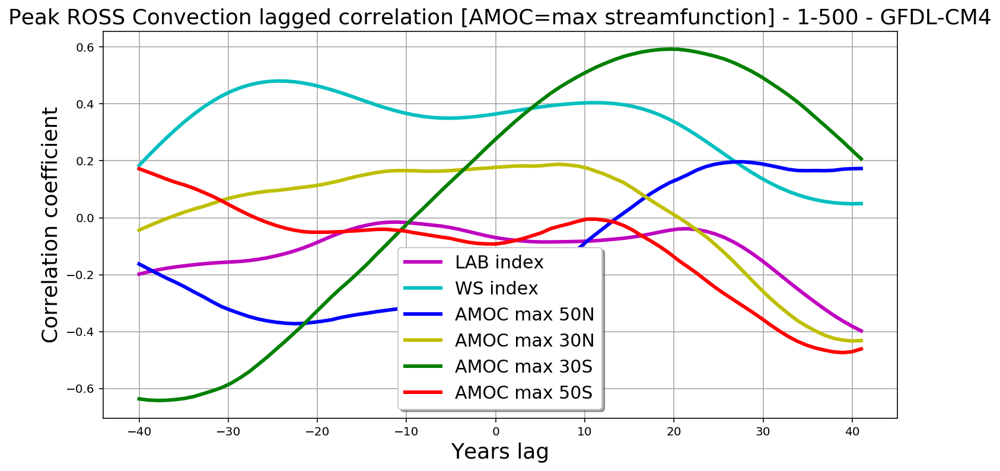

In [100]:
lag_time=40

fig=plt.figure()
lag_cor(ROSS_index_rm[:-9],LAB_index_rm[:-9],lag_time,'m','LAB index')
lag_cor(ROSS_index_rm[:-9],WS_index_rm[:-9],lag_time,'c','WS index')
lag_cor(ROSS_index_rm[:-9],AMOC_max_50N_m[:-9],lag_time,'b','AMOC max 50N')
lag_cor(ROSS_index_rm[:-9],AMOC_max_30N_m[:-9],lag_time,'y','AMOC max 30N')
lag_cor(ROSS_index_rm[:-9],AMOC_max_30S_m[:-9],lag_time,'g','AMOC max 30S')
lag_cor(ROSS_index_rm[:-9],AMOC_max_50S_m[:-9],lag_time,'r','AMOC max 50S')
plt.legend()
plt.title('Peak ROSS Convection lagged correlation [AMOC=max streamfunction] - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
plt.xlabel('Years lag', fontsize=18)
plt.ylabel('Correlation coefficient', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.legend(shadow=True, prop={'size': 15})
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_lagcor_ROSSconvection_AMOC_max_1.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

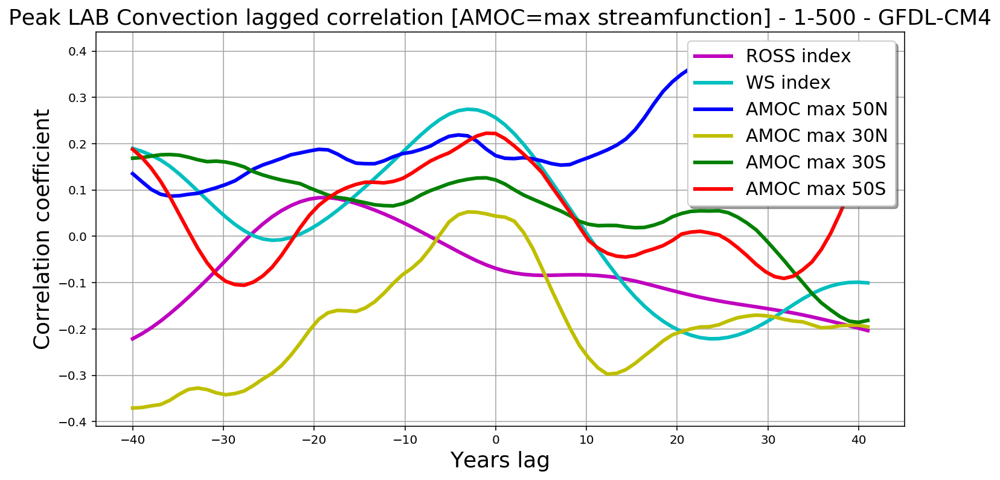

In [101]:
lag_time=40

fig=plt.figure()
lag_cor(LAB_index_rm[:-9],ROSS_index_rm[:-9],lag_time,'m','ROSS index')
lag_cor(LAB_index_rm[:-9],WS_index_rm[:-9],lag_time,'c','WS index')
lag_cor(LAB_index_rm[:-9],AMOC_max_50N_m[:-9],lag_time,'b','AMOC max 50N')
lag_cor(LAB_index_rm[:-9],AMOC_max_30N_m[:-9],lag_time,'y','AMOC max 30N')
lag_cor(LAB_index_rm[:-9],AMOC_max_30S_m[:-9],lag_time,'g','AMOC max 30S')
lag_cor(LAB_index_rm[:-9],AMOC_max_50S_m[:-9],lag_time,'r','AMOC max 50S')
plt.legend()
plt.title('Peak LAB Convection lagged correlation [AMOC=max streamfunction] - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
plt.xlabel('Years lag', fontsize=18)
plt.ylabel('Correlation coefficient', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.legend(shadow=True, prop={'size': 15})
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+str(GCM)+'_lagcor_LABconvection_AMOC_max_1.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

In [23]:
df = pd.read_csv('pangeo-cmip6-zarr-consolidated-stores.csv')

In [46]:
uri_tos='gs://cmip6/CMIP/NOAA-GFDL/GFDL-CM4/piControl/r1i1p1f1/Omon/tos/gr/'
ds_tos = func_load_ds_uri(uri_tos)

In [47]:
#ds_tos

In [48]:
yrs_no = np.int(len(ds_tos.time)/12)
Lon_orig=ds_tos.lon.values
Lat_orig=ds_tos.lat.values

In [49]:
Airtemp_final=[]
for t in tqdm(range(yrs_no)):
    ds_tos_extracted=ds_tos.tos.isel(time= slice(12*t,12*t+11) ).values
    data=np.squeeze(ds_tos_extracted)
    data=np.mean(data, axis=0)
    data_i = func_regrid(data, Lat_orig, Lon_orig, Lat_regrid_2D, Lon_regrid_2D)
    data_i[np.abs(data_i)>1e16]=np.nan # converting 1e+20 to nan
    
    Airtemp_final.append(data_i)

Airtemp_final=np.asarray(Airtemp_final)

In [50]:
ii_WS = np.where(WS_index_norm_rm <-0.5)
jj_WS = np.where(WS_index_norm_rm >0.5)

Airtemp_final_WS_c=Airtemp_final[ii_WS]
Airtemp_final_WS_n=Airtemp_final[jj_WS]
conv_WS=np.nanmean(Airtemp_final_WS_c,axis=0)
nonconv_WS=np.nanmean(Airtemp_final_WS_n,axis=0)

composite_WS=np.subtract(conv_WS,nonconv_WS)

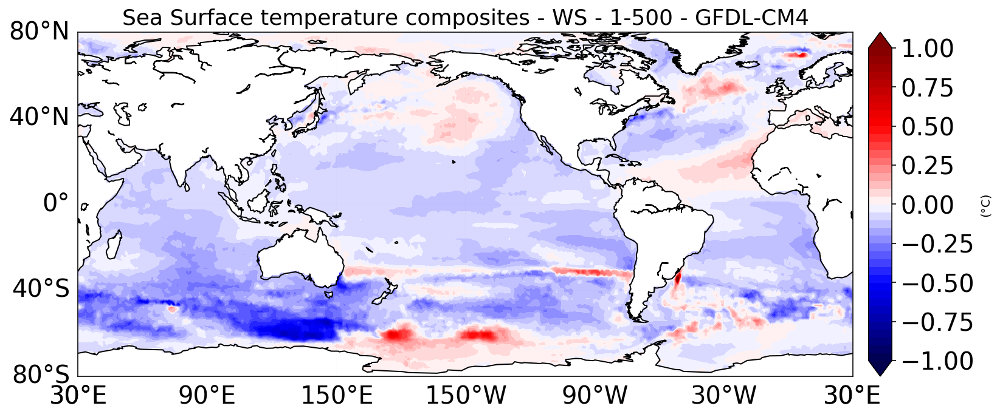

In [124]:
Plot_Var = composite_WS
#cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99)))
Plot_range=np.linspace(-1,1,41)
Plot_unit='(°C)'; Plot_title= 'Sea Surface temperature composites - WS - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)
fig, m = func_plotmap_contourf(Plot_Var, Lon_regrid_2D, Lat_regrid_2D, Plot_range, Plot_title, Plot_unit, plt.cm.seismic, 'cyl', 210., 80., -80., '-')
#fig.savefig(dir_figs+str(GCM)+'_surface_temperature_composites_WS.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

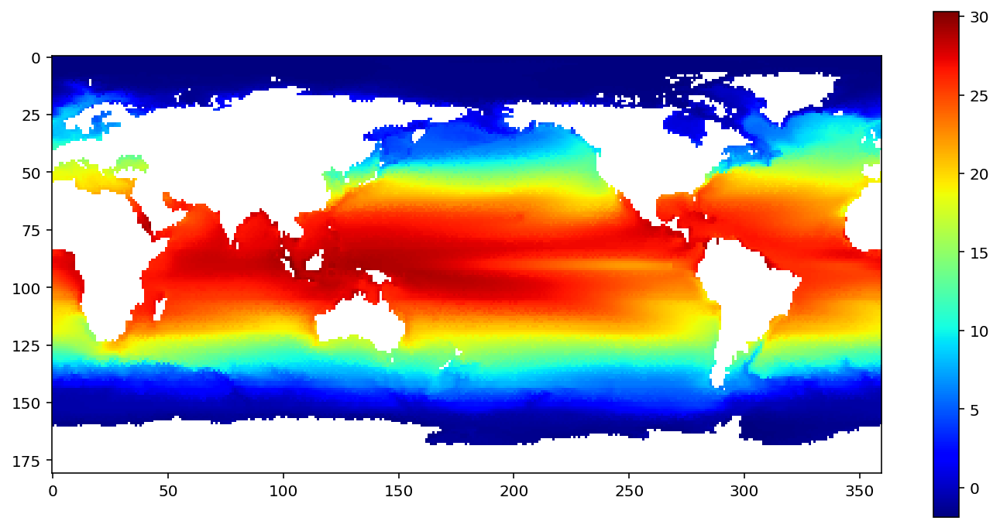

In [54]:
### Just to see the average value of the dataset used to calculate the composites ###
plt.imshow(np.flipud(np.nanmean(Airtemp_final,axis=0)), cmap=plt.cm.jet)
plt.colorbar()
plt.show()

In [61]:
ii_LAB = np.where(LAB_index_norm_rm <-0.5)
jj_LAB = np.where(LAB_index_norm_rm >0.5)

Airtemp_final_LAB_c=Airtemp_final[ii_LAB]
Airtemp_final_LAB_n=Airtemp_final[jj_LAB]
conv_LAB=np.nanmean(Airtemp_final_LAB_c,axis=0)
nonconv_LAB=np.nanmean(Airtemp_final_LAB_n,axis=0)

composite_LAB=np.subtract(conv_LAB,nonconv_LAB)

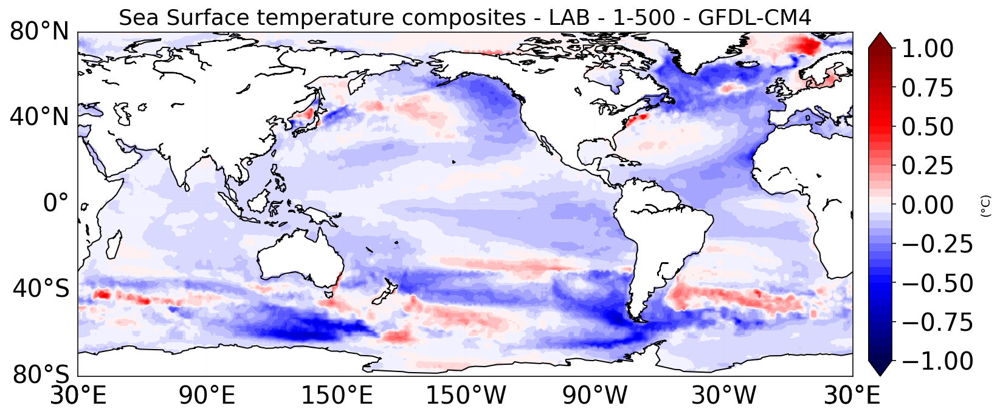

In [129]:
Plot_Var = composite_LAB
#cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99)))
Plot_range=np.linspace(-1,1,41)
Plot_unit='(°C)'; Plot_title= 'Sea Surface temperature composites - LAB - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)
fig, m = func_plotmap_contourf(Plot_Var, Lon_regrid_2D, Lat_regrid_2D, Plot_range, Plot_title, Plot_unit, plt.cm.seismic, 'cyl', 210., 80., -80., '-')
fig.savefig(dir_figs+str(GCM)+'_surface_temperature_composites_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

In [64]:
ii_ROSS = np.where(ROSS_index_norm_rm <-0.5)
jj_ROSS = np.where(ROSS_index_norm_rm >0.5)

Airtemp_final_ROSS_c=Airtemp_final[ii_ROSS]
Airtemp_final_ROSS_n=Airtemp_final[jj_ROSS]
conv_ROSS=np.nanmean(Airtemp_final_ROSS_c,axis=0)
nonconv_ROSS=np.nanmean(Airtemp_final_ROSS_n,axis=0)

composite_ROSS=np.subtract(conv_ROSS,nonconv_ROSS)

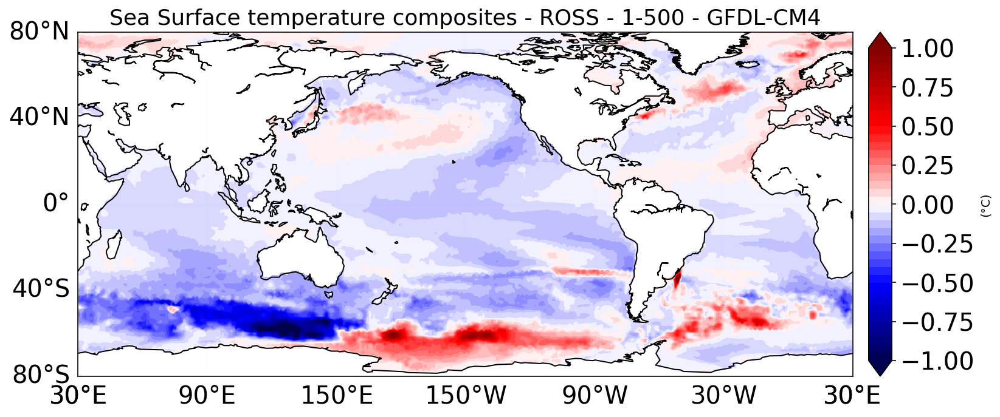

In [131]:
Plot_Var = composite_ROSS
#cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99)))
Plot_range=np.linspace(-1,1,41)
Plot_unit='(°C)'; Plot_title= 'Sea Surface temperature composites - ROSS - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)
fig, m = func_plotmap_contourf(Plot_Var, Lon_regrid_2D, Lat_regrid_2D, Plot_range, Plot_title, Plot_unit, plt.cm.seismic, 'cyl', 210., 80., -80., '-')
#fig.savefig(dir_figs+str(GCM)+'_surface_temperature_composites_ROSS.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

In [ ]:
####################################################################
#######           Westerlies and Trades Calculations        ########
####################################################################

In [28]:
df_plt = df[(df.variable_id == 'tauuo') & (df.experiment_id == 'piControl')& (df.source_id=='GFDL-CM4')]
#df_plt = df_plt[ df_plt['grid_label'] == 'gr']
run_counts = df_plt.groupby(['source_id', 'experiment_id'])['zstore'].count()
run_counts

source_id  experiment_id
GFDL-CM4   piControl        1
Name: zstore, dtype: int64

In [29]:
uri_tauuo = df_plt[(df_plt.source_id == GCM_name)].zstore.values[0]
uri_tauuo

'gs://cmip6/CMIP/NOAA-GFDL/GFDL-CM4/piControl/r1i1p1f1/Omon/tauuo/gn/'

In [30]:
ds_tauuo = func_load_ds_uri(uri_tauuo)

In [32]:
Lon_orig=ds_tauuo.lon.values
Lat_orig=ds_tauuo.lat.values    

Lon_orig = np.array(Lon_orig).copy() # To solve the issue with imuutability of the variable (ValueError: assignment destination is read-only)
Lat_orig = np.array(Lat_orig).copy()

In [33]:
yrs_no = np.int(len(ds_tauuo.time)/12)
Tau_X =[]
for t in tqdm(range(yrs_no)):
    ds_tauuo_extracted=ds_tauuo.tauuo.isel(time= slice(12*t,12*t+11) ).values
    data=np.squeeze(ds_tauuo_extracted)
    data=np.mean(data, axis=0)
    data_i = func_regrid(data, Lat_orig, Lon_orig, Lat_regrid_2D, Lon_regrid_2D)
    data_i[np.abs(data_i)>1e16]=np.nan # converting 1e+20 to nan
    
    Tau_X .append(data_i)
Tau_X = np.asarray(Tau_X)

In [52]:
df_plt = df[(df.variable_id == 'tauvo') & (df.experiment_id == 'piControl')& (df.source_id=='GFDL-CM4')]
#df_plt = df_plt[ df_plt['grid_label'] == 'gr']
run_counts = df_plt.groupby(['source_id', 'experiment_id'])['zstore'].count()
run_counts

source_id  experiment_id
GFDL-CM4   piControl        1
Name: zstore, dtype: int64

In [53]:
uri_tauvo = df_plt[(df_plt.source_id == GCM_name)].zstore.values[0]
uri_tauvo

'gs://cmip6/CMIP/NOAA-GFDL/GFDL-CM4/piControl/r1i1p1f1/Omon/tauvo/gn/'

In [54]:
ds_tauvo = func_load_ds_uri(uri_tauvo)

In [56]:
yrs_no = np.int(len(ds_tauvo.time)/12)
Tau_Y =[]
for t in tqdm(range(yrs_no)):
    ds_tauvo_extracted=ds_tauvo.tauvo.isel(time= slice(12*t,12*t+11) ).values
    data=np.squeeze(ds_tauvo_extracted)
    data=np.mean(data, axis=0)
    data_i = func_regrid(data, Lat_orig, Lon_orig, Lat_regrid_2D, Lon_regrid_2D)
    data_i[np.abs(data_i)>1e16]=np.nan # converting 1e+20 to nan
    
    Tau_Y .append(data_i)
Tau_Y = np.asarray(Tau_Y)

distributed.scheduler - INFO - Register tcp://10.32.8.2:39889
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.8.2:39889
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.8.3:37447
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.8.3:37447
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (1,)
distributed.deploy.adaptive - INFO - Retiring workers [1]
distributed.scheduler - INFO - Remove worker tcp://10.32.8.2:39889
distributed.core - INFO - Removing comms to tcp://10.32.8.2:39889
distributed.scheduler - INFO - Register tcp://10.32.8.4:45465
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.8.4:45465
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (2,)
distributed.deploy.adaptive - INFO - Retiring workers [2]
distributed.scheduler - 

In [63]:
Wind_Curl = np.zeros(( Tau_X.shape[0], Tau_X.shape[1], Tau_X.shape[2]))  # Wind_Curl = ( D_Tau_Y / D_X ) - ( D_Tau_X / D_Y ) # D_X = (Lon_1 - Lon_2) * COS(Lat)
for tt in tqdm(range (0,Tau_X.shape[0])):
    
    for ii in range (1,Tau_X.shape[1]-1):
        for jj in range (1,Tau_X.shape[2]-1): # Wind_Curl = ( D_Tau_Y / D_X ) - ( D_Tau_X / D_Y ) # D_X = (Lon_1 - Lon_2) * COS(Lat)
            
            Wind_Curl[tt,ii,jj] = (  ( Tau_Y[tt, ii,jj+1] - Tau_Y[tt, ii,jj-1] ) /  np.absolute(  ( ( Lon_regrid_2D[ii,jj+1] -  Lon_regrid_2D[ii,jj-1] ) * 111321  *  math.cos(math.radians( ( Lat_regrid_2D[ii,jj])))   )  )     )   -   (  ( Tau_X[tt, ii+1,jj] - Tau_X[tt, ii-1,jj] ) / np.absolute( ( ( Lat_regrid_2D[ii+1,jj] -  Lat_regrid_2D[ii-1,jj] ) * 111321 ) )  )

        Wind_Curl[tt,ii,0] = (  ( Tau_Y[tt, ii,1] - Tau_Y[tt, ii,-1] ) /  np.absolute(  ( ( Lon_regrid_2D[ii,1] -  Lon_regrid_2D[ii,-1] ) * 111321  *  math.cos(math.radians( ( Lat_regrid_2D[ii,0])))   )  )     )   -   (  ( Tau_X[tt, ii+1,0] - Tau_X[tt, ii-1,0] ) / np.absolute( ( ( Lat_regrid_2D[ii+1,0] -  Lat_regrid_2D[ii-1,0] ) * 111321 ) )  )
        Wind_Curl[tt,ii,-1] = (  ( Tau_Y[tt, ii,0] - Tau_Y[tt, ii,-2] ) /  np.absolute(  ( ( Lon_regrid_2D[ii,0] -  Lon_regrid_2D[ii,-2] ) * 111321  *  math.cos(math.radians( ( Lat_regrid_2D[ii,-1])))   )  )     )   -   (  ( Tau_X[tt, ii+1,-1] - Tau_X[tt, ii-1,-1] ) / np.absolute( ( ( Lat_regrid_2D[ii+1,-1] -  Lat_regrid_2D[ii-1,-1] ) * 111321 ) )  )


In [64]:
Wind_Curl_f = np.zeros(( Tau_X.shape[0], Tau_X.shape[1], Tau_X.shape[2])) # Wind_Crul / f # f = coriolis parameter = 2Wsin(LAT) , W = 7.292E-5 rad/s

for tt in tqdm(range (0,Tau_X.shape[0])):
    
    for ii in range (1,Tau_X.shape[1]-1):
        if np.absolute( Lat_regrid_2D[ii,0] ) >= 5: # Only calulate for Lats > 5N and Lats < 5S, to avoid infinit numbers in equator where f is zero
            for jj in range (1,Tau_X.shape[2]-1): # Wind_Curl = ( D_Tau_Y / D_X ) - ( D_Tau_X / D_Y ) # D_X = (Lon_1 - Lon_2) * COS(Lat)
            
                Wind_Curl_f[tt,ii,jj] = (  ( ( Tau_Y[tt, ii,jj+1] - Tau_Y[tt, ii,jj-1] ) / ( 2*7.292E-5 *  math.sin(math.radians( ( Lat_regrid_2D[ii,jj]))) ) ) /  np.absolute(  ( ( Lon_regrid_2D[ii,jj+1] -  Lon_regrid_2D[ii,jj-1] ) * 111321  *  math.cos(math.radians( ( Lat_regrid_2D[ii,jj])))   )  )     )   -   (  ( ( Tau_X[tt, ii+1,jj] - Tau_X[tt, ii-1,jj] ) / ( 2*7.292E-5 *  math.sin(math.radians( ( Lat_regrid_2D[ii,jj]))) ) ) / np.absolute( ( ( Lat_regrid_2D[ii+1,jj] -  Lat_regrid_2D[ii-1,jj] ) * 111321 ) )  )

            Wind_Curl_f[tt,ii,0] = (  ( ( Tau_Y[tt, ii,1] - Tau_Y[tt, ii,-1] ) / ( 2*7.292E-5 *  math.sin(math.radians( ( Lat_regrid_2D[ii,0]))) ) ) /  np.absolute(  ( ( Lon_regrid_2D[ii,1] -  Lon_regrid_2D[ii,-1] ) * 111321  *  math.cos(math.radians( ( Lat_regrid_2D[ii,0])))   )  )     )   -   (  ( ( Tau_X[tt, ii+1,jj] - Tau_X[tt, ii-1,0] ) / ( 2*7.292E-5 *  math.sin(math.radians( ( Lat_regrid_2D[ii,0]))) ) ) / np.absolute( ( ( Lat_regrid_2D[ii+1,0] -  Lat_regrid_2D[ii-1,0] ) * 111321 ) )  )
            Wind_Curl_f[tt,ii,-1] = (  ( ( Tau_Y[tt, ii,0] - Tau_Y[tt, ii,-2] ) / ( 2*7.292E-5 *  math.sin(math.radians( ( Lat_regrid_2D[ii,-1]))) ) ) /  np.absolute(  ( ( Lon_regrid_2D[ii,0] -  Lon_regrid_2D[ii,-2] ) * 111321  *  math.cos(math.radians( ( Lat_regrid_2D[ii,-1])))   )  )     )   -   (  ( ( Tau_X[tt, ii+1,-1] - Tau_X[tt, ii-1,-1] ) / ( 2*7.292E-5 *  math.sin(math.radians( ( Lat_regrid_2D[ii,-1]))) ) ) / np.absolute( ( ( Lat_regrid_2D[ii+1,-1] -  Lat_regrid_2D[ii-1,-1] ) * 111321 ) )  )


In [66]:
# ###############################################################################
# ###########                 Saving Results                #####################
# dir_pwd = os.getcwd() # Gets the current directory (and in which the code is placed)
# filename_out = (dir_pwd + '/'+GCM+'_500yr_Winds.out') # Directory to save processed data
# #################        To Save:        #####################################
# import os
# import shelve
# my_shelf = shelve.open(filename_out,'n') # 'n' for new
# var_list_1=['Tau_X', 'Tau_Y','Wind_Curl','Wind_Curl_f']
# for key in var_list_1:
#     try:
#         my_shelf[key] = globals()[key]
#     except TypeError:
#         print('ERROR shelving: {0}'.format(key))
# my_shelf.close()

In [66]:
#############################################################################
################        To restore:        ##################################
import os
import shelve

dir_pwd = os.getcwd() # Gets the current directory (and in which the code is placed)
filename_out = (dir_pwd + '/'+GCM+'_500yr_Winds.out') # Directory to save processed data

my_shelf = shelve.open(filename_out)
for key in my_shelf:
    globals()[key]=my_shelf[key]
my_shelf.close()

In [96]:
R_ii_WS = np.where(WS_index_norm_rm <-0.5) # Yeas where convection index is < -0.5 : convection years in Weddell Sea
R_jj_WS = np.where(WS_index_norm_rm >0.5) # Yeas where convection index is > 0.5 : non-convection years in Weddell Sea

Wind_Curl_c=Wind_Curl[R_ii_WS]
Wind_Curl_n=Wind_Curl[R_jj_WS]
Wind_Curl_conv_WS=np.nanmean(Wind_Curl_c,axis=0)
Wind_Curl_nonconv_WS=np.nanmean(Wind_Curl_n,axis=0)
Wind_Curl_composite_WS=np.subtract(Wind_Curl_conv_WS, Wind_Curl_nonconv_WS)

Wind_Curl_f_c=Wind_Curl_f[R_ii_WS]
Wind_Curl_f_n=Wind_Curl_f[R_jj_WS]
Wind_Curl_f_conv_WS=np.nanmean(Wind_Curl_f_c,axis=0)
Wind_Curl_f_nonconv_WS=np.nanmean(Wind_Curl_f_n,axis=0)
Wind_Curl_f_composite_WS=np.subtract(Wind_Curl_f_conv_WS, Wind_Curl_f_nonconv_WS)

Tau_X_c=Tau_X[R_ii_WS]
Tau_X_n=Tau_X[R_jj_WS]
Tau_X_conv_WS=np.nanmean(Tau_X_c,axis=0)
Tau_X_nonconv_WS=np.nanmean(Tau_X_n,axis=0)
Tau_X_composite_WS=np.subtract(Tau_X_conv_WS, Tau_X_nonconv_WS)

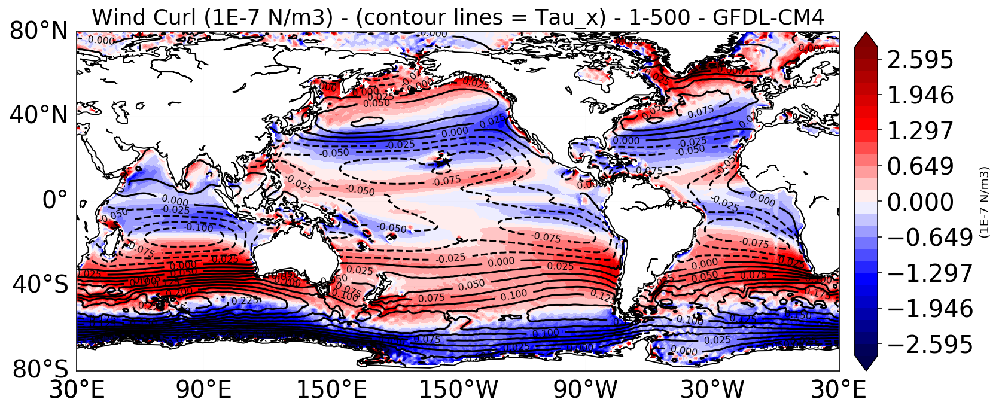

In [84]:
Plot_Var = np.nanmean(Wind_Curl,axis=0) * 1E7
Plot_Var[ Ocean_Land_mask==0 ]=np.nan # masking over land, so grid cells that fall on land area (value=0) will be deleted
Plot_Var2 = np.nanmean(Tau_X,axis=0)
Plot_Var2 [ Ocean_Land_mask==0 ]=np.nan # masking over land, so grid cells that fall on land area (value=0) will be deleted

cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99)))
Plot_range=np.linspace(-cmap_limit,cmap_limit,27)
Plot_unit='(1E-7 N/m3)'; Plot_title= 'Wind Curl (1E-7 N/m3) - (contour lines = Tau_x) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)

fig=plt.figure()
m = Basemap( projection='cyl', lon_0=210., llcrnrlon=P_lon0-180, llcrnrlat=-80., urcrnrlon=210.+180, urcrnrlat=80.)
m.drawparallels(np.arange(-80., 80.+0.001, 40.),labels=[True,False,False,False], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Latitutes
m.drawmeridians(np.arange(210.-180,210.+180,60.),labels=[False,False,False,True], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Longitudes        
m.drawcoastlines(linewidth=1.0, linestyle='solid', color='k', antialiased=1, ax=None, zorder=None)
im=m.contourf(Lon_regrid_2D, Lat_regrid_2D, Plot_Var,Plot_range,latlon=True, cmap=plt.cm.seismic, extend='both')
cbar = m.colorbar(im,"right", size="3%", pad="2%")
cbar.ax.tick_params(labelsize=20) 
cbar.set_label(Plot_unit)
plt.title(Plot_title, fontsize=18)
mng = plt.get_current_fig_manager()

im2=m.contour(Lon_regrid_2D, Lat_regrid_2D,Plot_Var2, 20, latlon=True, colors='k')
plt.clabel(im2, fontsize=8, inline=1)
#fig.savefig(dir_figs+'Wind_Curl_'+str(GCM)+'.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

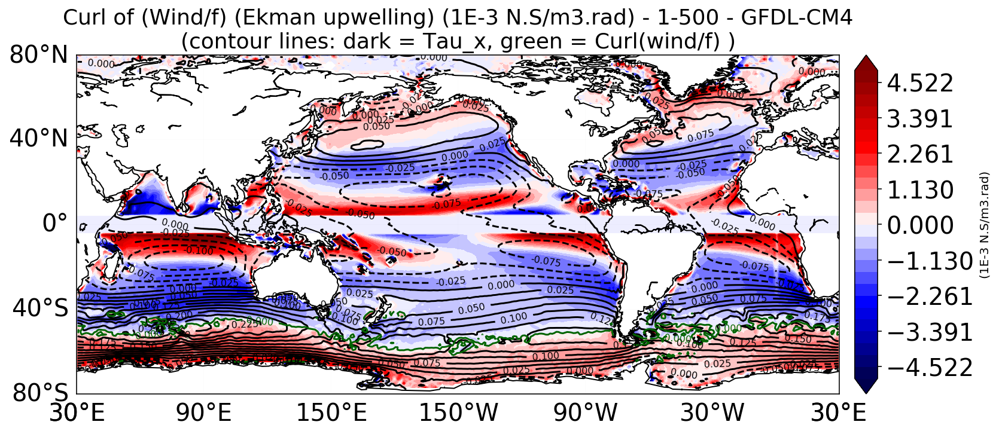

In [71]:
Plot_Var = np.nanmean(Wind_Curl_f,axis=0) * 1E3
Plot_Var2 = np.nanmean(Tau_X,axis=0)
Plot_Var2 [ Ocean_Land_mask==0 ]=np.nan # masking over land, so grid cells that fall on land area (value=0) will be deleted

cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99)))
Plot_range=np.linspace(-cmap_limit,cmap_limit,27)
Plot_unit='(1E-3 N.S/m3.rad)'; Plot_title= 'Curl of (Wind/f) (Ekman upwelling) (1E-3 N.S/m3.rad) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)+'\n(contour lines: dark = Tau_x, green = Curl(wind/f) )'

fig=plt.figure()
m = Basemap( projection='cyl', lon_0=210., llcrnrlon=210-180, llcrnrlat=-80., urcrnrlon=210.+180, urcrnrlat=80.)
m.drawparallels(np.arange(-80., 80.+0.001, 40.),labels=[True,False,False,False], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Latitutes
m.drawmeridians(np.arange(210.-180,210.+180,60.),labels=[False,False,False,True], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Longitudes        
m.drawcoastlines(linewidth=1.0, linestyle='solid', color='k', antialiased=1, ax=None, zorder=None)
im=m.contourf(Lon_regrid_2D, Lat_regrid_2D, Plot_Var,Plot_range,latlon=True, cmap=plt.cm.seismic, extend='both')
cbar = m.colorbar(im,"right", size="3%", pad="2%")
cbar.ax.tick_params(labelsize=20) 
cbar.set_label(Plot_unit)
plt.title(Plot_title, fontsize=18)
mng = plt.get_current_fig_manager()

im2=m.contour(Lon_regrid_2D, Lat_regrid_2D,Plot_Var2, 20, latlon=True, colors='k')
plt.clabel(im2, fontsize=8, inline=1)
im3=m.contour(Lon_regrid_2D[25:50,:], Lat_regrid_2D[25:50,:],Plot_Var[25:50,:], levels = [0], latlon=True, colors='darkgreen')
plt.clabel(im3, fontsize=8, inline=1)
plt.show()
#fig.savefig(dir_figs+'Wind_Curl_f_'+str(GCM)+'.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

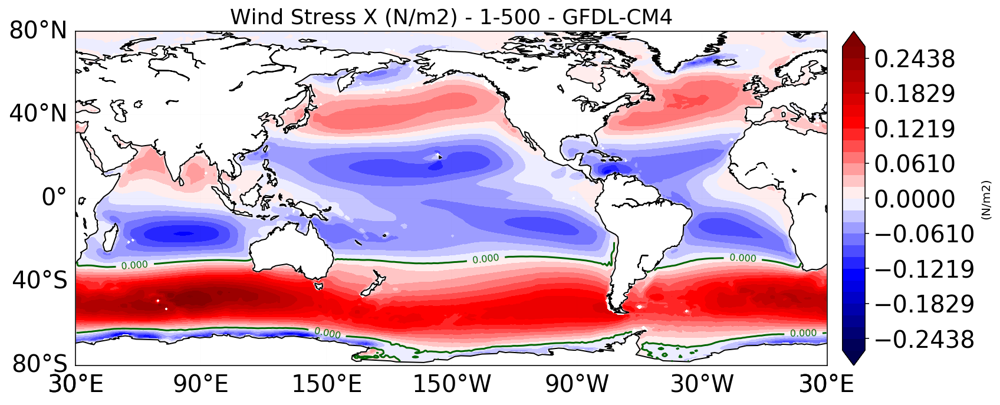

In [85]:
Plot_Var = np.nanmean(Tau_X,axis=0)
Plot_Var_l=copy.deepcopy(Plot_Var)  ; Plot_Var_l[ Ocean_Land_mask==0 ]= np.nan

cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var3, 99.99)))
Plot_range=np.linspace(-cmap_limit,cmap_limit,27)
Plot_unit='(N/m2)'; Plot_title= 'Wind Stress X (N/m2) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)

fig=plt.figure()
m = Basemap( projection='cyl', lon_0=210., llcrnrlon=210-180, llcrnrlat=-80., urcrnrlon=210.+180, urcrnrlat=80.)
m.drawparallels(np.arange(-80., 80.+0.001, 40.),labels=[True,False,False,False], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Latitutes
m.drawmeridians(np.arange(210.-180,210.+180,60.),labels=[False,False,False,True], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Longitudes        
m.drawcoastlines(linewidth=1.0, linestyle='solid', color='k', antialiased=1, ax=None, zorder=None)
im=m.contourf(Lon_regrid_2D, Lat_regrid_2D, Plot_Var,Plot_range,latlon=True, cmap=plt.cm.seismic, extend='both')
cbar = m.colorbar(im,"right", size="3%", pad="2%")
cbar.ax.tick_params(labelsize=20) 
cbar.set_label(Plot_unit)
plt.title(Plot_title, fontsize=18)
mng = plt.get_current_fig_manager()

im2=m.contour(Lon_regrid_2D[0:70,:], Lat_regrid_2D[0:70,:],Plot_Var_l[0:70,:], levels = [0], latlon=True, colors='darkgreen')
plt.clabel(im2, fontsize=8, inline=1)
#fig.savefig(dir_figs+'Wind_Tau_X_'+str(GCM)+'.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

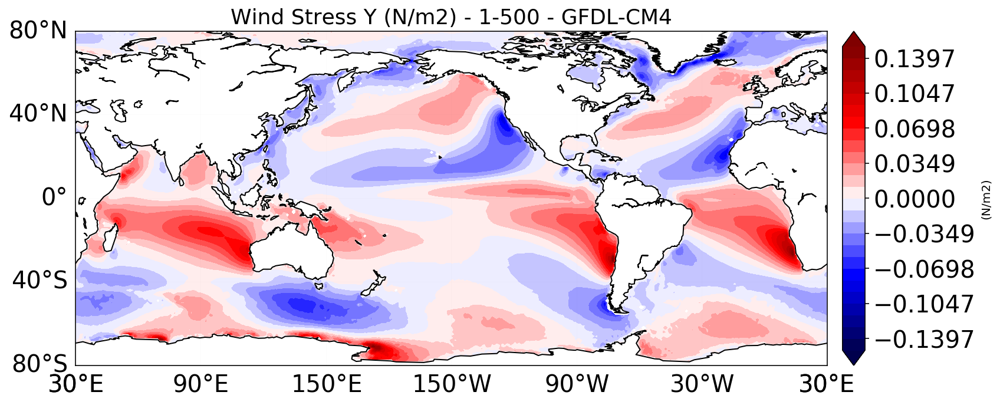

In [92]:
Plot_Var = np.nanmean(Tau_Y,axis=0)

cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99.99)))
Plot_range=np.linspace(-cmap_limit,cmap_limit,27)
Plot_unit='(N/m2)'; Plot_title= 'Wind Stress Y (N/m2) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)

fig=plt.figure()
m = Basemap( projection='cyl', lon_0=210., llcrnrlon=210-180, llcrnrlat=-80., urcrnrlon=210.+180, urcrnrlat=80.)
m.drawparallels(np.arange(-80., 80.+0.001, 40.),labels=[True,False,False,False], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Latitutes
m.drawmeridians(np.arange(210.-180,210.+180,60.),labels=[False,False,False,True], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Longitudes        
m.drawcoastlines(linewidth=1.0, linestyle='solid', color='k', antialiased=1, ax=None, zorder=None)
im=m.contourf(Lon_regrid_2D, Lat_regrid_2D, Plot_Var,Plot_range,latlon=True, cmap=plt.cm.seismic, extend='both')
cbar = m.colorbar(im,"right", size="3%", pad="2%")
cbar.ax.tick_params(labelsize=20) 
cbar.set_label(Plot_unit)
plt.title(Plot_title, fontsize=18)
mng = plt.get_current_fig_manager()
#fig.savefig(dir_figs+'Wind_Tau_Y_'+str(GCM)+'.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

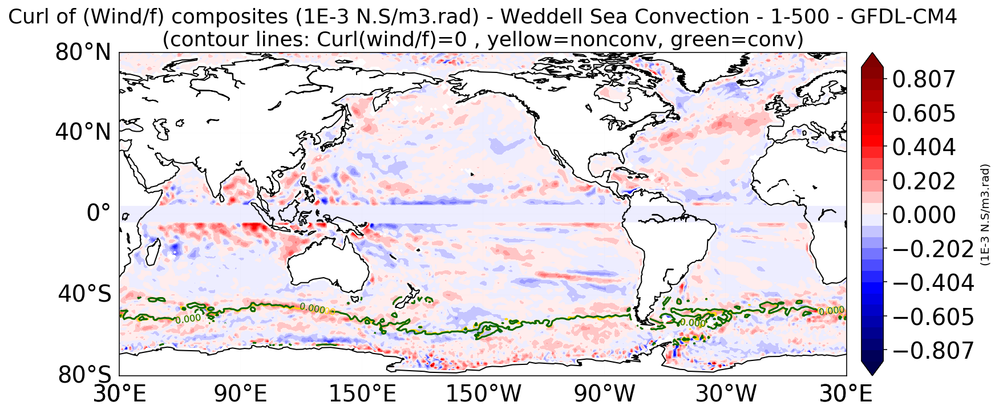

In [98]:
Plot_Var = copy.deepcopy(Wind_Curl_f_composite_WS) * 1E3

cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99.7)))
Plot_range=np.linspace(-cmap_limit,cmap_limit,27)
Plot_unit='(1E-3 N.S/m3.rad)'; Plot_title= 'Curl of (Wind/f) composites (1E-3 N.S/m3.rad) - Weddell Sea Convection - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)+'\n(contour lines: Curl(wind/f)=0 , yellow=nonconv, green=conv)'

fig=plt.figure()
m = Basemap( projection='cyl', lon_0=210., llcrnrlon=210-180, llcrnrlat=-80., urcrnrlon=210.+180, urcrnrlat=80.)
m.drawparallels(np.arange(-80., 80.+0.001, 40.),labels=[True,False,False,False], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Latitutes
m.drawmeridians(np.arange(210.-180,210.+180,60.),labels=[False,False,False,True], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Longitudes        
m.drawcoastlines(linewidth=1.0, linestyle='solid', color='k', antialiased=1, ax=None, zorder=None)
im=m.contourf(Lon_regrid_2D, Lat_regrid_2D, Plot_Var,Plot_range,latlon=True, cmap=plt.cm.seismic, extend='both')
cbar = m.colorbar(im,"right", size="3%", pad="2%")
cbar.ax.tick_params(labelsize=20) 
cbar.set_label(Plot_unit)
plt.title(Plot_title, fontsize=18)
mng = plt.get_current_fig_manager()

im2=m.contour(Lon_regrid_2D[25:50,:], Lat_regrid_2D[25:50,:],Wind_Curl_f_nonconv_WS[25:50,:], levels = [0], latlon=True, colors='gold')
plt.clabel(im2, fontsize=8, inline=1)
im3=m.contour(Lon_regrid_2D[25:50,:], Lat_regrid_2D[25:50,:],Wind_Curl_f_conv_WS[25:50,:], levels = [0], latlon=True, colors='darkgreen')
plt.clabel(im3, fontsize=8, inline=1)
plt.show()
#fig.savefig(dir_figs+'Wind_Curl_f_composites_WS_'+str(GCM)+'.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

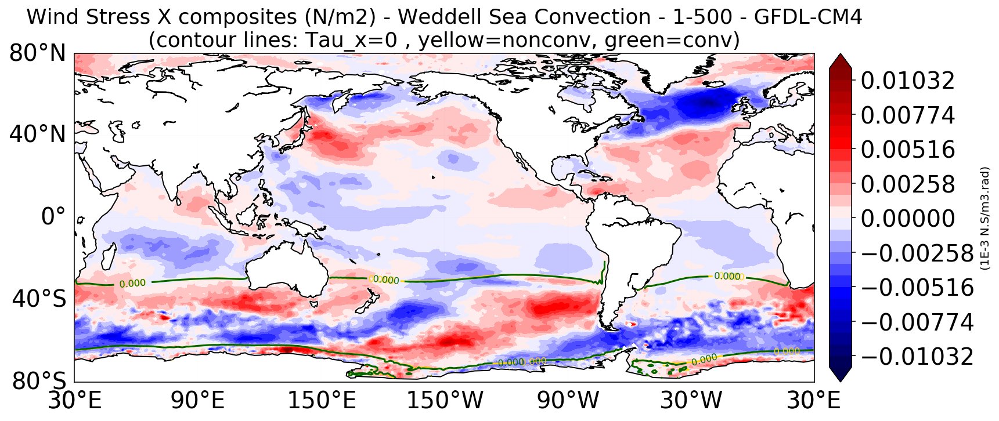

In [100]:
Plot_Var = copy.deepcopy(Tau_X_composite_WS)
#Plot_Var_f[ Ocean_Land_mask==0 ]=nan # masking over land, so grid cells that fall on land area (value=0) will be deleted
Plot_Var1_l=copy.deepcopy(Tau_X_nonconv_WS)  ; Plot_Var1_l[ Ocean_Land_mask==0 ]=np.nan
Plot_Var2_l=copy.deepcopy(Tau_X_conv_WS)  ; Plot_Var2_l[ Ocean_Land_mask==0 ]=np.nan

cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99.99)))
Plot_range=np.linspace(-cmap_limit,cmap_limit,27)
Plot_unit='(1E-3 N.S/m3.rad)'; Plot_title= 'Wind Stress X composites (N/m2) - Weddell Sea Convection - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)+'\n(contour lines: Tau_x=0 , yellow=nonconv, green=conv)'

fig=plt.figure()
m = Basemap( projection='cyl', lon_0=210., llcrnrlon=210-180, llcrnrlat=-80., urcrnrlon=210.+180, urcrnrlat=80.)
m.drawparallels(np.arange(-80., 80.+0.001, 40.),labels=[True,False,False,False], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Latitutes
m.drawmeridians(np.arange(210.-180,210.+180,60.),labels=[False,False,False,True], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Longitudes        
m.drawcoastlines(linewidth=1.0, linestyle='solid', color='k', antialiased=1, ax=None, zorder=None)
im=m.contourf(Lon_regrid_2D, Lat_regrid_2D, Plot_Var,Plot_range,latlon=True, cmap=plt.cm.seismic, extend='both')
cbar = m.colorbar(im,"right", size="3%", pad="2%")
cbar.ax.tick_params(labelsize=20) 
cbar.set_label(Plot_unit)
plt.title(Plot_title, fontsize=18)
mng = plt.get_current_fig_manager()

im2=m.contour(Lon_regrid_2D[0:70,:], Lat_regrid_2D[0:70,:],Plot_Var1_l[0:70,:], levels = [0], latlon=True, colors='gold')
plt.clabel(im2, fontsize=8, inline=1)
im3=m.contour(Lon_regrid_2D[0:70,:], Lat_regrid_2D[0:70,:],Plot_Var2_l[0:70,:], levels = [0], latlon=True, colors='darkgreen')
plt.clabel(im3, fontsize=8, inline=1)
plt.show()
#fig.savefig(dir_figs+'Wind_Tau_X_composites_WS_'+str(GCM)+'.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

In [67]:
R_ii_LAB = np.where(LAB_index_norm_rm <-0.5) # Yeas where convection index is < -0.5 : convection years in Labrador Sea
R_jj_LAB = np.where(LAB_index_norm_rm >0.5) # Yeas where convection index is > 0.5 : non-convection years in Labrador Sea

Wind_Curl_c=Wind_Curl[R_ii_LAB]
Wind_Curl_n=Wind_Curl[R_jj_LAB]
Wind_Curl_conv_LAB=np.nanmean(Wind_Curl_c,axis=0)
Wind_Curl_nonconv_LAB=np.nanmean(Wind_Curl_n,axis=0)
Wind_Curl_composite_LAB=np.subtract(Wind_Curl_conv_LAB, Wind_Curl_nonconv_LAB)

Wind_Curl_f_c=Wind_Curl_f[R_ii_LAB]
Wind_Curl_f_n=Wind_Curl_f[R_jj_LAB]
Wind_Curl_f_conv_LAB=np.nanmean(Wind_Curl_f_c,axis=0)
Wind_Curl_f_nonconv_LAB=np.nanmean(Wind_Curl_f_n,axis=0)
Wind_Curl_f_composite_LAB=np.subtract(Wind_Curl_f_conv_LAB, Wind_Curl_f_nonconv_LAB)

Tau_X_c=Tau_X[R_ii_LAB]
Tau_X_n=Tau_X[R_jj_LAB]
Tau_X_conv_LAB=np.nanmean(Tau_X_c,axis=0)
Tau_X_nonconv_LAB=np.nanmean(Tau_X_n,axis=0)
Tau_X_composite_LAB=np.subtract(Tau_X_conv_LAB, Tau_X_nonconv_LAB)

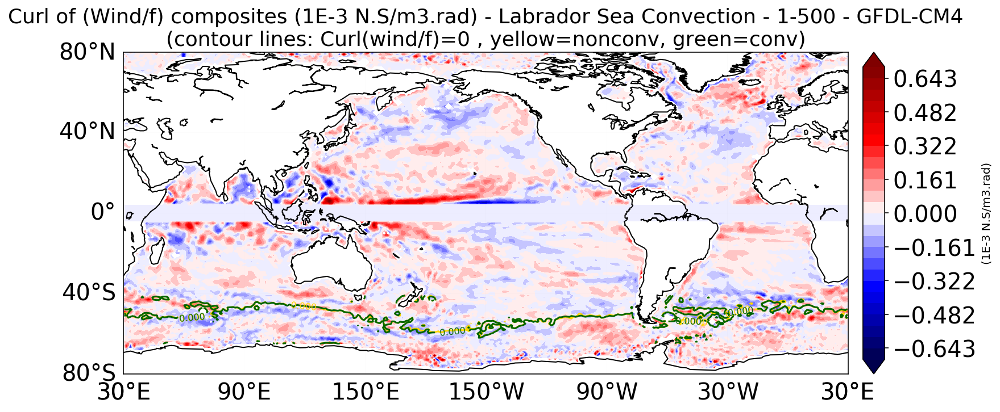

In [72]:
Plot_Var = copy.deepcopy(Wind_Curl_f_composite_LAB) * 1E3

cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99.7)))
Plot_range=np.linspace(-cmap_limit,cmap_limit,27)
Plot_unit='(1E-3 N.S/m3.rad)'; Plot_title= 'Curl of (Wind/f) composites (1E-3 N.S/m3.rad) - Labrador Sea Convection - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)+'\n(contour lines: Curl(wind/f)=0 , yellow=nonconv, green=conv)'

fig=plt.figure()
m = Basemap( projection='cyl', lon_0=210., llcrnrlon=210-180, llcrnrlat=-80., urcrnrlon=210.+180, urcrnrlat=80.)
m.drawparallels(np.arange(-80., 80.+0.001, 40.),labels=[True,False,False,False], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Latitutes
m.drawmeridians(np.arange(210.-180,210.+180,60.),labels=[False,False,False,True], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Longitudes        
m.drawcoastlines(linewidth=1.0, linestyle='solid', color='k', antialiased=1, ax=None, zorder=None)
im=m.contourf(Lon_regrid_2D, Lat_regrid_2D, Plot_Var,Plot_range,latlon=True, cmap=plt.cm.seismic, extend='both')
cbar = m.colorbar(im,"right", size="3%", pad="2%")
cbar.ax.tick_params(labelsize=20) 
cbar.set_label(Plot_unit)
plt.title(Plot_title, fontsize=18)
mng = plt.get_current_fig_manager()

im2=m.contour(Lon_regrid_2D[25:50,:], Lat_regrid_2D[25:50,:],Wind_Curl_f_nonconv_LAB[25:50,:], levels = [0], latlon=True, colors='gold')
plt.clabel(im2, fontsize=8, inline=1)
im3=m.contour(Lon_regrid_2D[25:50,:], Lat_regrid_2D[25:50,:],Wind_Curl_f_conv_LAB[25:50,:], levels = [0], latlon=True, colors='darkgreen')
plt.clabel(im3, fontsize=8, inline=1)
plt.show()
#fig.savefig(dir_figs+'Wind_Curl_f_composites_LAB_'+str(GCM)+'.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

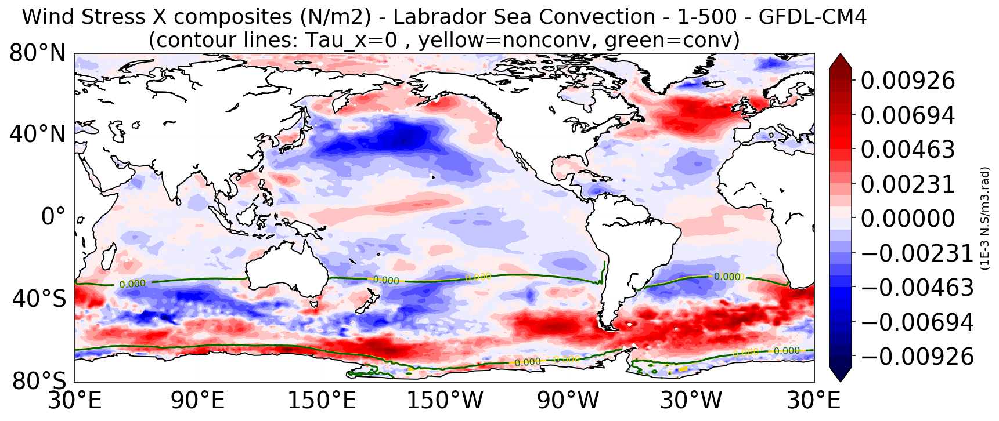

In [73]:
Plot_Var = copy.deepcopy(Tau_X_composite_LAB)
#Plot_Var_f[ Ocean_Land_mask==0 ]=nan # masking over land, so grid cells that fall on land area (value=0) will be deleted
Plot_Var1_l=copy.deepcopy(Tau_X_nonconv_LAB)  ; Plot_Var1_l[ Ocean_Land_mask==0 ]=np.nan
Plot_Var2_l=copy.deepcopy(Tau_X_conv_LAB)  ; Plot_Var2_l[ Ocean_Land_mask==0 ]=np.nan

cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99.99)))
Plot_range=np.linspace(-cmap_limit,cmap_limit,27)
Plot_unit='(1E-3 N.S/m3.rad)'; Plot_title= 'Wind Stress X composites (N/m2) - Labrador Sea Convection - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)+'\n(contour lines: Tau_x=0 , yellow=nonconv, green=conv)'

fig=plt.figure()
m = Basemap( projection='cyl', lon_0=210., llcrnrlon=210-180, llcrnrlat=-80., urcrnrlon=210.+180, urcrnrlat=80.)
m.drawparallels(np.arange(-80., 80.+0.001, 40.),labels=[True,False,False,False], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Latitutes
m.drawmeridians(np.arange(210.-180,210.+180,60.),labels=[False,False,False,True], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Longitudes        
m.drawcoastlines(linewidth=1.0, linestyle='solid', color='k', antialiased=1, ax=None, zorder=None)
im=m.contourf(Lon_regrid_2D, Lat_regrid_2D, Plot_Var,Plot_range,latlon=True, cmap=plt.cm.seismic, extend='both')
cbar = m.colorbar(im,"right", size="3%", pad="2%")
cbar.ax.tick_params(labelsize=20) 
cbar.set_label(Plot_unit)
plt.title(Plot_title, fontsize=18)
mng = plt.get_current_fig_manager()

im2=m.contour(Lon_regrid_2D[0:70,:], Lat_regrid_2D[0:70,:],Plot_Var1_l[0:70,:], levels = [0], latlon=True, colors='gold')
plt.clabel(im2, fontsize=8, inline=1)
im3=m.contour(Lon_regrid_2D[0:70,:], Lat_regrid_2D[0:70,:],Plot_Var2_l[0:70,:], levels = [0], latlon=True, colors='darkgreen')
plt.clabel(im3, fontsize=8, inline=1)
plt.show()
#fig.savefig(dir_figs+'Wind_Tau_X_composites_LAB_'+str(GCM)+'.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

In [74]:
R_ii_ROSS = np.where(ROSS_index_norm_rm <-0.5) # Yeas where convection index is < -0.5 : convection years in Ross Sea
R_jj_ROSS = np.where(ROSS_index_norm_rm >0.5) # Yeas where convection index is > 0.5 : non-convection years in Ross Sea

Wind_Curl_c=Wind_Curl[R_ii_ROSS]
Wind_Curl_n=Wind_Curl[R_jj_ROSS]
Wind_Curl_conv_ROSS=np.nanmean(Wind_Curl_c,axis=0)
Wind_Curl_nonconv_ROSS=np.nanmean(Wind_Curl_n,axis=0)
Wind_Curl_composite_ROSS=np.subtract(Wind_Curl_conv_ROSS, Wind_Curl_nonconv_ROSS)

Wind_Curl_f_c=Wind_Curl_f[R_ii_ROSS]
Wind_Curl_f_n=Wind_Curl_f[R_jj_ROSS]
Wind_Curl_f_conv_ROSS=np.nanmean(Wind_Curl_f_c,axis=0)
Wind_Curl_f_nonconv_ROSS=np.nanmean(Wind_Curl_f_n,axis=0)
Wind_Curl_f_composite_ROSS=np.subtract(Wind_Curl_f_conv_ROSS, Wind_Curl_f_nonconv_ROSS)

Tau_X_c=Tau_X[R_ii_ROSS]
Tau_X_n=Tau_X[R_jj_ROSS]
Tau_X_conv_ROSS=np.nanmean(Tau_X_c,axis=0)
Tau_X_nonconv_ROSS=np.nanmean(Tau_X_n,axis=0)
Tau_X_composite_ROSS=np.subtract(Tau_X_conv_ROSS, Tau_X_nonconv_ROSS)

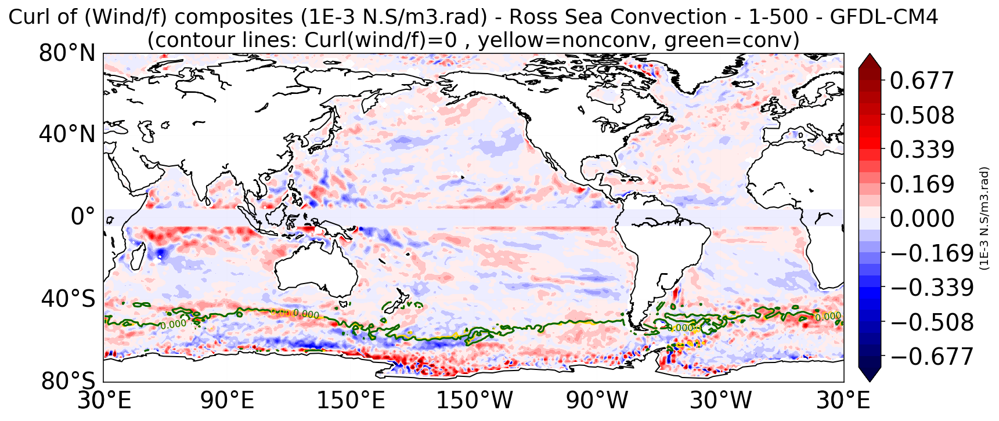

In [75]:
Plot_Var = copy.deepcopy(Wind_Curl_f_composite_ROSS) * 1E3

cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99.7)))
Plot_range=np.linspace(-cmap_limit,cmap_limit,27)
Plot_unit='(1E-3 N.S/m3.rad)'; Plot_title= 'Curl of (Wind/f) composites (1E-3 N.S/m3.rad) - Ross Sea Convection - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)+'\n(contour lines: Curl(wind/f)=0 , yellow=nonconv, green=conv)'

fig=plt.figure()
m = Basemap( projection='cyl', lon_0=210., llcrnrlon=210-180, llcrnrlat=-80., urcrnrlon=210.+180, urcrnrlat=80.)
m.drawparallels(np.arange(-80., 80.+0.001, 40.),labels=[True,False,False,False], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Latitutes
m.drawmeridians(np.arange(210.-180,210.+180,60.),labels=[False,False,False,True], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Longitudes        
m.drawcoastlines(linewidth=1.0, linestyle='solid', color='k', antialiased=1, ax=None, zorder=None)
im=m.contourf(Lon_regrid_2D, Lat_regrid_2D, Plot_Var,Plot_range,latlon=True, cmap=plt.cm.seismic, extend='both')
cbar = m.colorbar(im,"right", size="3%", pad="2%")
cbar.ax.tick_params(labelsize=20) 
cbar.set_label(Plot_unit)
plt.title(Plot_title, fontsize=18)
mng = plt.get_current_fig_manager()

im2=m.contour(Lon_regrid_2D[25:50,:], Lat_regrid_2D[25:50,:],Wind_Curl_f_nonconv_ROSS[25:50,:], levels = [0], latlon=True, colors='gold')
plt.clabel(im2, fontsize=8, inline=1)
im3=m.contour(Lon_regrid_2D[25:50,:], Lat_regrid_2D[25:50,:],Wind_Curl_f_conv_ROSS[25:50,:], levels = [0], latlon=True, colors='darkgreen')
plt.clabel(im3, fontsize=8, inline=1)
plt.show()
fig.savefig(dir_figs+'Wind_Curl_f_composites_ROSS_'+str(GCM)+'.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

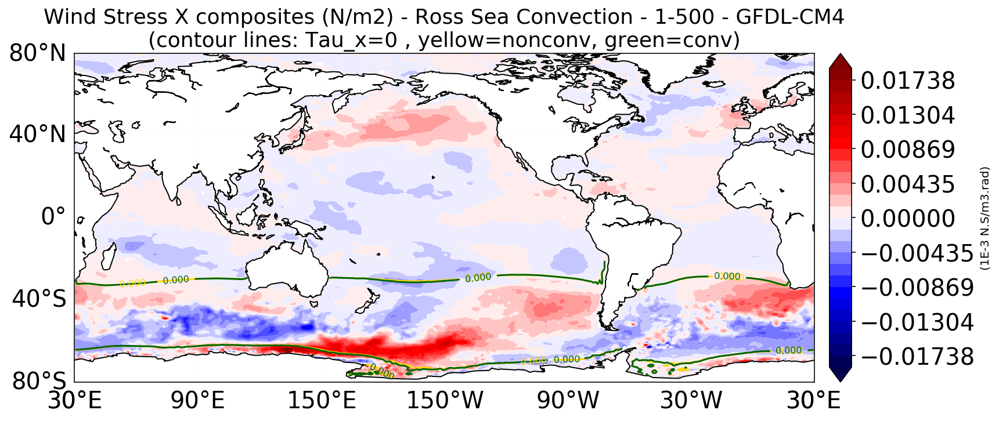

In [77]:
Plot_Var = copy.deepcopy(Tau_X_composite_ROSS)
#Plot_Var_f[ Ocean_Land_mask==0 ]=nan # masking over land, so grid cells that fall on land area (value=0) will be deleted
Plot_Var1_l=copy.deepcopy(Tau_X_nonconv_ROSS)  ; Plot_Var1_l[ Ocean_Land_mask==0 ]=np.nan
Plot_Var2_l=copy.deepcopy(Tau_X_conv_ROSS)  ; Plot_Var2_l[ Ocean_Land_mask==0 ]=np.nan

cmap_limit=np.nanmax(np.abs( np.nanpercentile(Plot_Var, 99.99)))
Plot_range=np.linspace(-cmap_limit,cmap_limit,27)
Plot_unit='(1E-3 N.S/m3.rad)'; Plot_title= 'Wind Stress X composites (N/m2) - Ross Sea Convection - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM)+'\n(contour lines: Tau_x=0 , yellow=nonconv, green=conv)'

fig=plt.figure()
m = Basemap( projection='cyl', lon_0=210., llcrnrlon=210-180, llcrnrlat=-80., urcrnrlon=210.+180, urcrnrlat=80.)
m.drawparallels(np.arange(-80., 80.+0.001, 40.),labels=[True,False,False,False], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Latitutes
m.drawmeridians(np.arange(210.-180,210.+180,60.),labels=[False,False,False,True], linewidth=0.01, color='k', fontsize=20) # labels = [left,right,top,bottom] # Longitudes        
m.drawcoastlines(linewidth=1.0, linestyle='solid', color='k', antialiased=1, ax=None, zorder=None)
im=m.contourf(Lon_regrid_2D, Lat_regrid_2D, Plot_Var,Plot_range,latlon=True, cmap=plt.cm.seismic, extend='both')
cbar = m.colorbar(im,"right", size="3%", pad="2%")
cbar.ax.tick_params(labelsize=20) 
cbar.set_label(Plot_unit)
plt.title(Plot_title, fontsize=18)
mng = plt.get_current_fig_manager()

im2=m.contour(Lon_regrid_2D[0:70,:], Lat_regrid_2D[0:70,:],Plot_Var1_l[0:70,:], levels = [0], latlon=True, colors='gold')
plt.clabel(im2, fontsize=8, inline=1)
im3=m.contour(Lon_regrid_2D[0:70,:], Lat_regrid_2D[0:70,:],Plot_Var2_l[0:70,:], levels = [0], latlon=True, colors='darkgreen')
plt.clabel(im3, fontsize=8, inline=1)
plt.show()
#fig.savefig(dir_figs+'Wind_Tau_X_composites_ROSS_'+str(GCM)+'.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

In [102]:
# Wind_Curl_f_40S60S_0W30W=Wind_Curl_f[:,30:51,330:]
# Wind_Curl_f_40S60S_0W30W=np.nanmean( Wind_Curl_f_40S60S_0W30W, axis=2)
# Wind_Curl_f_40S60S_0W30W=np.nanmean( Wind_Curl_f_40S60S_0W30W, axis=1)
# Wind_Curl_f_40S60S_0W30W_m=runningMeanFast(Wind_Curl_f_40S60S_0W30W, 10)

# Wind_Curl_f_50N65N_65W20W=Wind_Curl_f[:,140:156,295:341]
# Wind_Curl_f_50N65N_65W20W=np.nanmean( Wind_Curl_f_50N65N_65W20W, axis=2)
# Wind_Curl_f_50N65N_65W20W=np.nanmean( Wind_Curl_f_50N65N_65W20W, axis=1)
# Wind_Curl_f_50N65N_65W20W_m=runningMeanFast(Wind_Curl_f_50N65N_65W20W, 10)

# Wind_Curl_f_50N65N_65W41W=Wind_Curl_f[:,140:156,295:320]
# Wind_Curl_f_50N65N_65W41W=np.nanmean( Wind_Curl_f_50N65N_65W41W, axis=2)
# Wind_Curl_f_50N65N_65W41W=np.nanmean( Wind_Curl_f_50N65N_65W41W, axis=1)
# Wind_Curl_f_50N65N_65W41W_m=runningMeanFast(Wind_Curl_f_50N65N_65W41W, 10)

# Wind_Curl_f_65N80N_5W20E_1=Wind_Curl_f[:,155:171,355:360]
# Wind_Curl_f_65N80N_5W20E_2=Wind_Curl_f[:,155:171,0:21]
# Wind_Curl_f_65N80N_5W20E=np.concatenate((Wind_Curl_f_65N80N_5W20E_1, Wind_Curl_f_65N80N_5W20E_2), axis=2)
# Wind_Curl_f_65N80N_5W20E=np.nanmean(Wind_Curl_f_65N80N_5W20E, axis=2)
# Wind_Curl_f_65N80N_5W20E=np.nanmean(Wind_Curl_f_65N80N_5W20E, axis=1)
# Wind_Curl_f_65N80N_5W20E_m=runningMeanFast(Wind_Curl_f_65N80N_5W20E, 10)

# #North_Westerlies=Zonal_winds[:,135:145]

# AMOC_max_50S= AMOC_max[:,40] # AMOC at 50S # Max of streamfunction method
# AMOC_max_50S_m=runningMeanFast(AMOC_max_50S, 10)
# AMOC_max_30S= AMOC_max[:,60] # AMOC at 30S # Max of streamfunction method
# AMOC_max_30S_m=runningMeanFast(AMOC_max_30S, 10)
# AMOC_max_50N= AMOC_max[:,140] # AMOC at 50N # Max of streamfunction method
# AMOC_max_50N_m=runningMeanFast(AMOC_max_50N, 10)
# AMOC_max_30N= AMOC_max[:,120] # AMOC at 30N # Max of streamfunction method
# AMOC_max_30N_m=runningMeanFast(AMOC_max_30N, 10)

In [ ]:
Density_allyears = []
yrs_no = np.int(len(ds_thetao.time)/12)
Lon_orig=ds_thetao.lon.values
Lat_orig=ds_thetao.lat.values

import seawater as sw
for t in tqdm(range(yrs_no)):
    data_thetao_extracted = ds_thetao.thetao.isel(time= slice(12*t,12*t+12) ).values
    data_so_extracted = ds_so.so.isel(time= slice(12*t,12*t+12) ).values
    data_dens=sw.dens0(data_so_extracted, data_thetao_extracted)
    data_dens = np.nanmean(data_dens, axis=0)
    data_i = func_regrid(data_dens, Lat_orig, Lon_orig, Lat_regrid_2D, Lon_regrid_2D)
    data_i[np.abs(data_i)>1e16]=np.nan # converting 1e+20 to nan
    
    Density_allyears.append(data_i)

Density_allyears = np.asarray(Density_allyears)

np.save('Density_allyears_GFDL-CM4_500yr.npy', Density_allyears)

In [23]:
#####################################################################
Density_allyears=np.load('Density_allyears_GFDL-CM4_500yr.npy')

In [24]:
[ii,jj]=LAB_indeces_lonlat
LAB_Density_time_depth=[] 

for t in tqdm(range(Density_allyears.shape[0])):
    data_i=Density_allyears[t,:,ii,jj]
    LAB_Density_time_depth.append(np.nanmean(data_i,axis=0))
    
LAB_Density_time_depth = np.asarray(LAB_Density_time_depth)

In [28]:
month_no=3 # month of the year
hemis_no=1 # 0 = Weddell Sea, 1 = Labrador Sea, 2 = Norwegian Sea, 4 = Ross Sea

Density_allyears_winter_NH = []
yrs_no = np.int(len(ds_thetao.time)/12)
Lon_orig=ds_thetao.lon.values
Lat_orig=ds_thetao.lat.values

import seawater as sw
for t in tqdm(range(yrs_no)):
    data_thetao_extracted = ds_thetao.thetao.isel(time= 12*t+month_no-1 ).values
    data_so_extracted = ds_so.so.isel(time= 12*t+month_no-1 ).values
    data_dens=sw.dens0(data_so_extracted, data_thetao_extracted)
    #data_dens = np.nanmean(data_dens, axis=0)
    data_i = func_regrid(data_dens, Lat_orig, Lon_orig, Lat_regrid_2D, Lon_regrid_2D)
    data_i[np.abs(data_i)>1e16]=np.nan # converting 1e+20 to nan
    
    Density_allyears_winter_NH.append(data_i)

Density_allyears_winter_NH = np.asarray(Density_allyears_winter_NH)

#np.save('Density_allyears_winter_NH_GFDL-CM4_500yr.npy', Density_allyears_winter_NH)

In [47]:
Density_allyears_winter_NH=np.load('Density_allyears_winter_NH_GFDL-CM4_500yr.npy')

In [48]:
[ii,jj]=LAB_indeces_lonlat
LAB_Density_time_depth_winter=[] 

for t in tqdm(range(Density_allyears_winter_NH.shape[0])):
    data_i=Density_allyears_winter_NH[t,:,ii,jj]
    LAB_Density_time_depth_winter.append(np.nanmean(data_i,axis=0))
    
LAB_Density_time_depth_winter = np.asarray(LAB_Density_time_depth_winter)

LAB_index_density=LAB_Density_time_depth_winter[:,4]
LAB_index_density_norm=(LAB_index_density-np.nanmean(LAB_index_density))/np.std(LAB_index_density) # Normalized Convection Index

LAB_index_density_norm_rm = runningMeanFast(LAB_index_density_norm, 10)#if data is not smoothed
LAB_index_density_norm_rm=LAB_index_density_norm_rm[:-9]

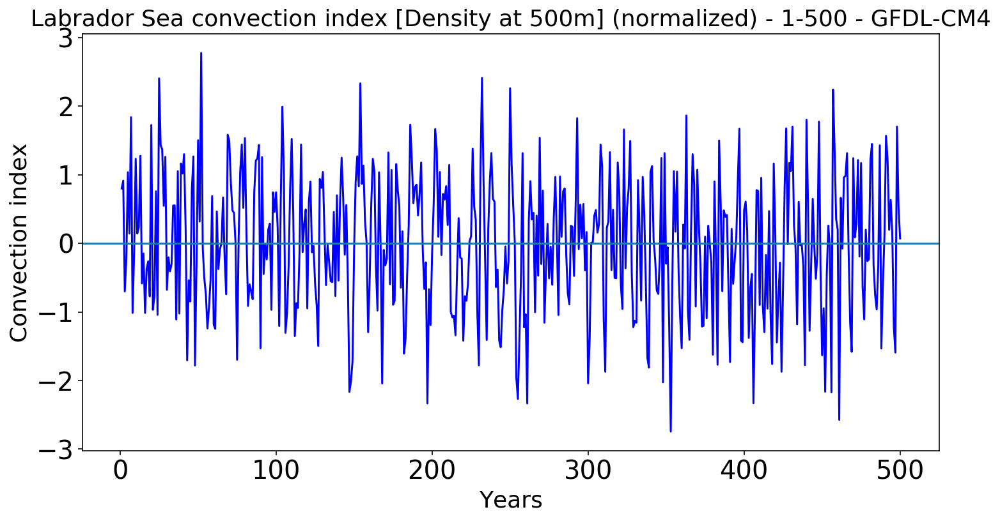

distributed.utils_perf - INFO - full garbage collection released 76.68 MB from 18743 reference cycles (threshold: 10.00 MB)


In [66]:
###########################################
### Convection Index Time Series Plots ####
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
#print (years,area)
plt.plot(years,LAB_index_density_norm,'b')
l = plt.axhline(y=0)
#plt.plot(years[st2],deep_conv_area_WS[st2],'r')
plt.xlabel('Years', fontsize=18)
plt.ylabel('Convection index', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Labrador Sea convection index [Density at 500m] (normalized) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full    
#fig.savefig(dir_figs+str(GCM)+'_convec_index_density_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

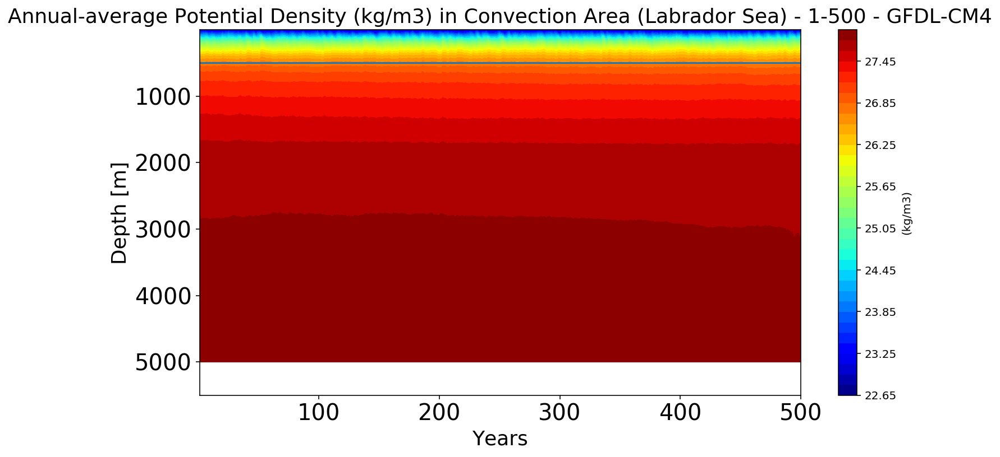

In [27]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths[0:33], np.transpose(LAB_Density_time_depth[:,0:33]-1000), 40, cmap=plt.cm.jet)
plt.gca().invert_yaxis()
l = plt.axhline(y=conv_index_depth_lab)
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Annual-average Potential Density (kg/m3) in Convection Area (Labrador Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
cbar.set_label('(kg/m3)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_density_annual_time_depth_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

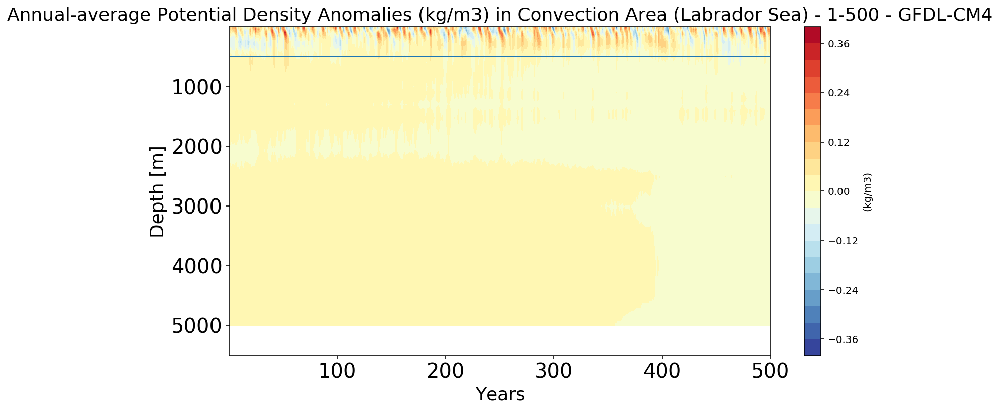

In [60]:
aa = np.nanmean(LAB_Density_time_depth,axis=0)
bb = copy.deepcopy(LAB_Density_time_depth)
for ii in range(LAB_Density_time_depth.shape[0]):
    bb[ii,:]=aa

fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths[0:33], np.transpose(LAB_Density_time_depth[:,0:33]-bb[:,0:33]), 20, cmap=plt.cm.RdYlBu_r)
plt.gca().invert_yaxis()
l = plt.axhline(y=conv_index_depth_lab)
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Annual-average Potential Density Anomalies (kg/m3) in Convection Area (Labrador Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
cbar.set_label('(kg/m3)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_density_annual_anomaly_time_depth_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

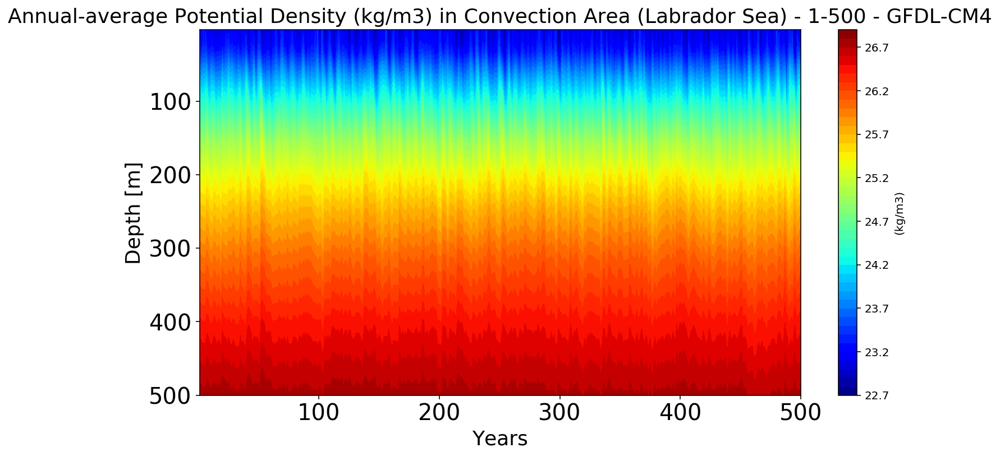

In [28]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths[0:14], np.transpose(LAB_Density_time_depth[:,0:14]-1000), 40, cmap=plt.cm.jet)
plt.gca().invert_yaxis()
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Annual-average Potential Density (kg/m3) in Convection Area (Labrador Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
#cbar = m.colorbar(im,"right", size="3%", pad="2%", extend='max') # extend='both' will extend the colorbar in both sides (upper side and down side)
cbar.set_label('(kg/m3)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_density_annual_time_depth_surface_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

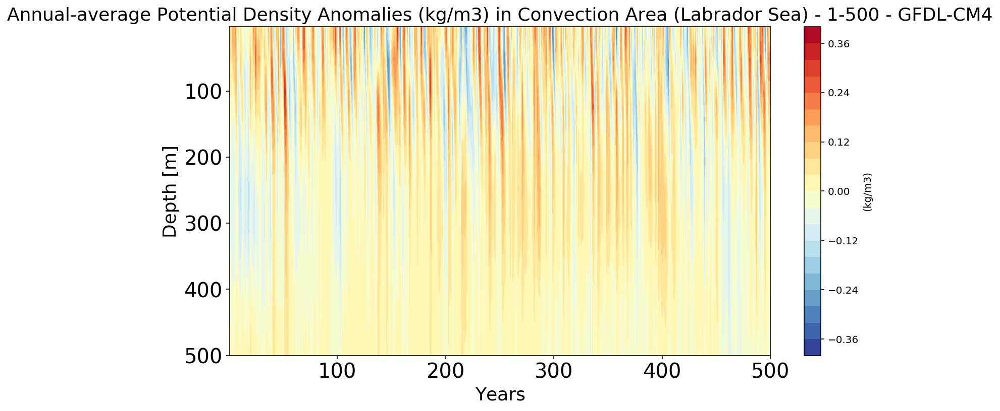

In [64]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths[0:14], np.transpose(LAB_Density_time_depth[:,0:14]-bb[:,0:14]), 20, cmap=plt.cm.RdYlBu_r)
plt.gca().invert_yaxis()
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Annual-average Potential Density Anomalies (kg/m3) in Convection Area (Labrador Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
#cbar = m.colorbar(im,"right", size="3%", pad="2%", extend='max') # extend='both' will extend the colorbar in both sides (upper side and down side)
cbar.set_label('(kg/m3)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_density_annual_anomaly_time_depth_surface_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

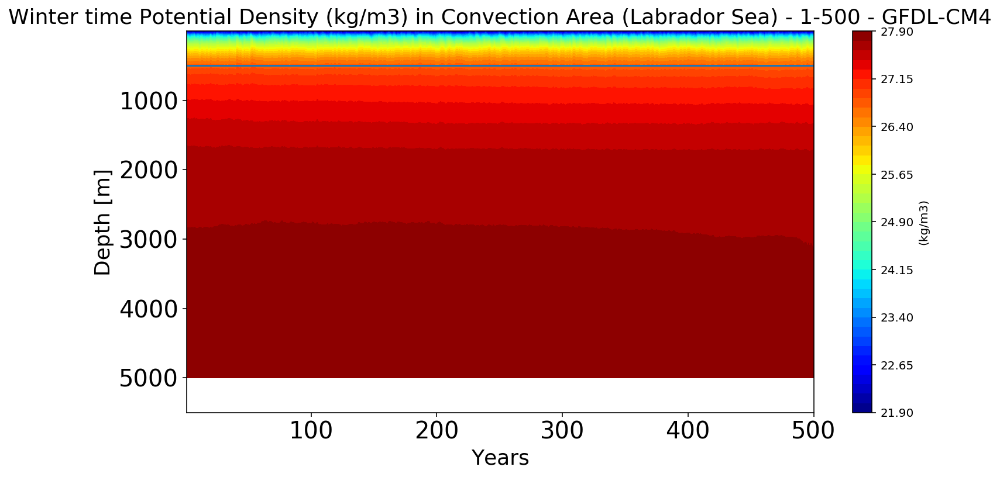

In [51]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths[0:33], np.transpose(LAB_Density_time_depth_winter[:,0:33]-1000), 40, cmap=plt.cm.jet)
plt.gca().invert_yaxis()
l = plt.axhline(y=conv_index_depth_lab)
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Winter time Potential Density (kg/m3) in Convection Area (Labrador Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
cbar.set_label('(kg/m3)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_density_winter_time_depth_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

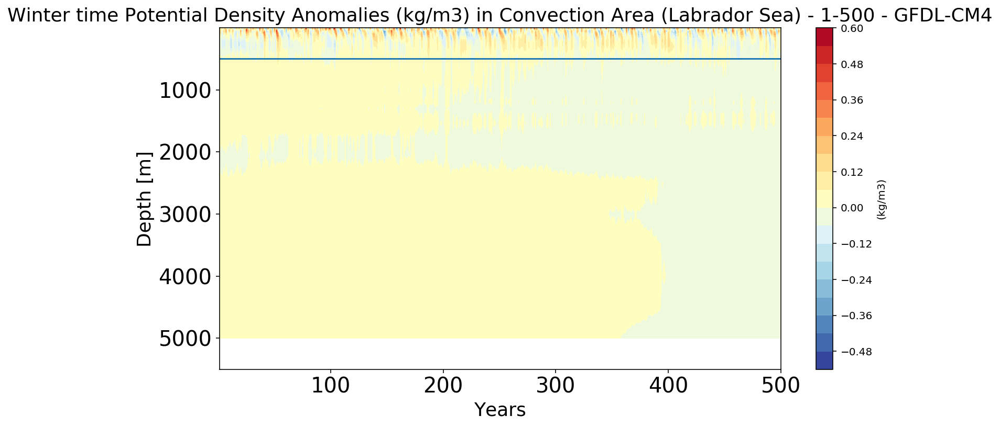

In [61]:
cc = np.nanmean(LAB_Density_time_depth_winter,axis=0)
dd = copy.deepcopy(LAB_Density_time_depth_winter)
for ii in range(LAB_Density_time_depth_winter.shape[0]):
    dd[ii,:]=cc

fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths[0:33], np.transpose(LAB_Density_time_depth_winter[:,0:33]-dd[:,0:33]), 20, cmap=plt.cm.RdYlBu_r)
plt.gca().invert_yaxis()
l = plt.axhline(y=conv_index_depth_lab)
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Winter time Potential Density Anomalies (kg/m3) in Convection Area (Labrador Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
cbar.set_label('(kg/m3)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_density_winter_anomaly_time_depth_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')

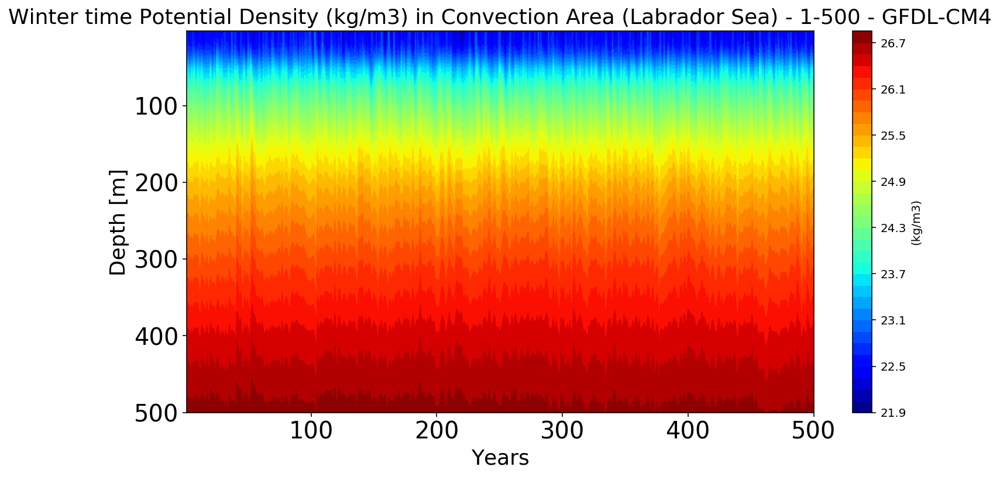

In [52]:
fig=plt.figure()
years=np.linspace(year_start,year_end,year_end-year_start+1)
im = plt.contourf(years, Depths[0:14], np.transpose(LAB_Density_time_depth_winter[:,0:14]-1000), 40, cmap=plt.cm.jet)
plt.gca().invert_yaxis()
plt.xlabel('Years', fontsize=18)
plt.ylabel('Depth [m]', fontsize=18)
plt.xticks(fontsize = 20); plt.yticks(fontsize = 20)
plt.title('Winter time Potential Density (kg/m3) in Convection Area (Labrador Sea) - '+str(year_start)+'-'+str(year_end)+' - '+str(GCM), fontsize=18)
cbar = plt.colorbar(im, extend='max')
#cbar = m.colorbar(im,"right", size="3%", pad="2%", extend='max') # extend='both' will extend the colorbar in both sides (upper side and down side)
cbar.set_label('(kg/m3)')
mng = plt.get_current_fig_manager()
#mng.window.showMaximized() # Maximizes the plot window to save figures in full
#fig.savefig(dir_figs+str(GCM)+'_density_winter_time_depth_surface_LAB.png', format='png', dpi=300, transparent=True, bbox_inches='tight')